# Introduction
State notebook purpose here

### Imports
Import libraries and write settings here.

In [2]:
# Notebooks specific imports
from IPython import get_ipython
ipython = get_ipython()
#Expand notebook display

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))
# Display all cell outputs
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'
# autoreload extension
if 'autoreload' not in ipython.extension_manager.loaded:
    %load_ext autoreload
%autoreload 2

# Basic useful imports
import re
import time
import yaml
from pprint import pprint
from pathlib import Path
import h5py

# Data manipulation
import numpy as np
from scipy.special import erf
from scipy.integrate import quad
import scipy.stats as stats

# Visualization
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import (Circle, RegularPolygon, FancyArrowPatch, ArrowStyle)
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator, NullFormatter)
import matplotlib.colors as colors

# From AMSOS_analysis.py
import amsos_analysis as aa

### Style settings

In [3]:
graph_sty = {
    "axes.titlesize": 20,
    "axes.labelsize": 24,
    "lines.linewidth": 2,
    "lines.markersize": 10,
    "xtick.labelsize": 24,
    "ytick.labelsize": 24,
    "font.size": 20,
    "font.sans-serif": 'Helvetica',
    "text.usetex": False,
    'mathtext.fontset': 'cm',
}
plt.style.use(graph_sty)
        

### Location

In [4]:
# workstation
#%cd /home/alamson/DATA/Chromatin/

# mnt
%cd /mnt/home/alamson/projects/DATA/Chromatin/

# ceph
#%cd /mnt/home/alamson/ceph/DATA/Chromatin/

/mnt/home/alamson/projects/DATA/Chromatin


In [5]:
ws_path = Path('/home/alamson/DATA/Chromatin/')
mnt_path = Path.home() / 'projects/DATA/Chromatin/'
ceph_path = Path.home() / 'ceph/DATA/Chromatin/'

# Functions

## Physical scale calculations

In [6]:
def get_drag_coeff(bead_rad, viscosity):
    ''' Dimensions of Length/(Time*Force) = Length^2/(Time*Energy)'''
    return 6.*np.pi*viscosity*bead_rad

print(get_drag_coeff(.01, 1000))

188.4955592153876


In [7]:
def get_char_time(bead_diam, viscosity, kT=.00411):
    ''' Characteristic time i.e. the time it takes for bead to diffuse its diameter '''
    return 4.*np.pi*viscosity*np.power(bead_diam, 3)/kT

print(get_char_time(.01, 1000.)) # in sec

3.0575110983842273


In [8]:
def get_poly_diffuse_dist(time, n_beads, bead_diam, viscosity, frac_dim=.5, kT=.00411 ):
    return np.sqrt(kT*time/(np.pi*viscosity*bead_diam*np.power(n_beads, frac_dim)))

print(get_poly_diffuse_dist(100*3600, 512, .02, 1000.)) # In microns

1.0201516513282987


In [9]:
def get_rouse_time(n_beads, bead_diam, viscosity, kT=.00411 ):
    return 2.*viscosity*np.power(bead_diam,3)*n_beads*n_beads/(3*np.pi*kT)

print(get_rouse_time(512, .02, 1000.)/3600) # In hours

30.077688313513075


In [10]:
def get_link_relax_time(bead_rad, viscosity, spring_const):
    return (6.*np.pi*viscosity*bead_rad)/spring_const

print(get_link_relax_time(.01, 1000, 3650)) # in seconds

0.05164261896311989


In [11]:
def get_pfract(n_chrom, rad_chrom, n_crowd, rad_crowd, rad_sys):
    return (n_chrom*(rad_chrom**3) + n_crowd*(rad_crowd**3))/(rad_sys**3)

print(get_pfract(520, .01, 100000, .005, .5))

0.10416000000000002


## Radial distribution function

In [73]:
def rad_distr_func_avg(dist_mat, nbins=100, hist_max=.5, orig_density=1.):
    """TODO: Docstring for cylindrical histogram.
    @param pos_mat TODO
    @param nbins TODO
    @return: TODO
    """

    rad_distr_func, rad_bin_edges = np.histogram(
        dist_mat.flatten(), nbins, range=[
            0, hist_max], density=False)
    dr = rad_bin_edges[1:] - rad_bin_edges[:-1]
    rad = .5 * (rad_bin_edges[1:] + rad_bin_edges[:-1])
    rad_distr_func = rad_distr_func.astype(float)
    

    rad_distr_func /= 2. * np.pi * np.power(rad, 2) * dr * orig_density
    return (rad_distr_func, rad_bin_edges)

def make_rad_distr_func_graph(dist_mat, nbins=500, hist_max=.5, system_volume=1.0):
    fig, ax = plt.subplots(figsize=(8,6))
    nsteps = dist_mat.shape[-1]
    nbeads = dist_mat.shape[0]
    density = float(nbeads)/system_volume
    rad_distr_func, rad_bin_edges = rad_distr_func_avg(dist_mat, nbins, hist_max, orig_density=density)
    rad_distr_func /= nsteps
    rad = .5 * (rad_bin_edges[1:] + rad_bin_edges[:-1])
    ax.plot(rad[1:], rad_distr_func[1:])
    ax.set_yscale('log')
    ax.set_xlabel(r'Bead separation $r$ ($\mu$m)')
    ax.set_ylabel(r'Radial distribution function $g(r)$')
    
    return fig, ax, rad_distr_func, rad
 

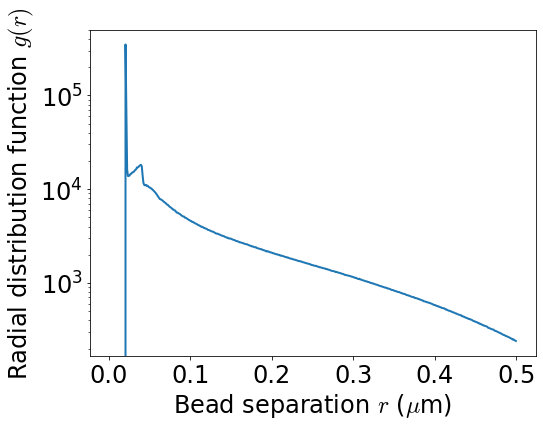

In [74]:
data_path = (ceph_path /"21-05-18_AMchr1_scan.8_loop520_pin/simulations/s2/")
ss_ind = 900
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[0, 520])
    vol = np.pi*(.5**3)/.75
    fig, ax, rad_distr_func, rad_arr = make_rad_distr_func_graph(dist_mat, system_volume=vol)

tmp1 = rad_distr_func[1:]
#plt.yscale("log")



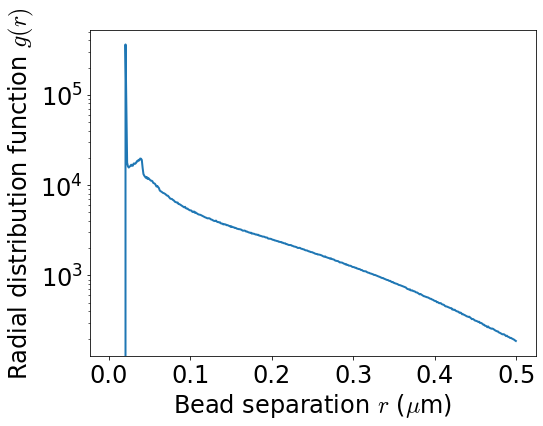

In [196]:
data_path = ceph_path / \
    "21-06-04_AMchr1_scan.8_loop520_pin_crowder5000_crRad.015/simulations/s2/"
ss_ind = -100
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[0, 520])
    vol = np.pi*(.5**3)/.75
    fig, ax, rad_distr_func, rad_arr = make_rad_distr_func_graph(dist_mat, system_volume=vol)

tmp2 = rad_distr_func[1:]
#plt.yscale("log")


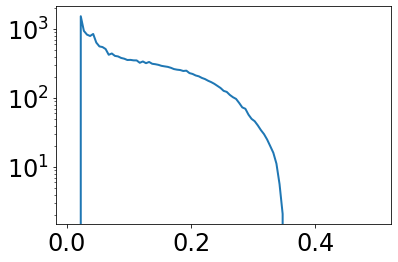

In [15]:
plt.plot(rad[1:], tmp2-tmp1)
plt.yscale("log")

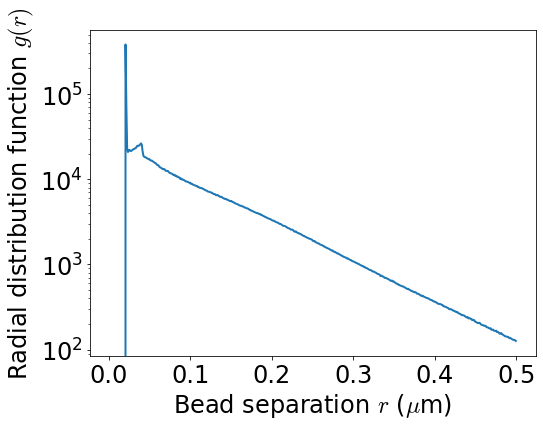

In [194]:
data_path = ceph_path / "21-05-27_AMchr1_scan.8_loop520_pin_crowder5000_crRad.02/simulations/s2/"
ss_ind = -100

with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    dist_mat = aa.get_sep_dist_mat(h5_data, ss_ind, bead_range=[0, 520])
    vol = np.pi*(.5**3)/.75
    fig, ax, rad_distr_func, rad_arr = make_rad_distr_func_graph(dist_mat, system_volume=vol)
    
tmp3 = rad_distr_func[1:]



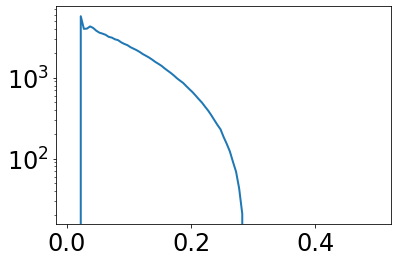

In [17]:
plt.plot(rad[1:], tmp3-tmp1)
plt.yscale("log")

## Summed contact kymo

In [180]:
def make_summed_contact_kymo_graph(contact_mat, time_arr, contact_type="", vmax=10):
    fig, axarr = plt.subplots(1,2, figsize=(16,6))
    
    nbeads = contact_mat.shape[0]
    x = np.arange(nbeads + 1)[::int((nbeads) / contact_mat.shape[0])]
    X, Y = np.meshgrid(x, x)
    c0 = axarr[0].pcolorfast(X, Y, np.log(contact_mat[:,:,-1]), vmin=-50)
    axarr[0].set_aspect('equal')
    _ = fig.colorbar(c0, ax=axarr[0], label="Log contact probability")
    _ = axarr[0].set_xlabel(r'Bead index')
    _ = axarr[0].set_ylabel(r'Bead index')

    contact_kymo = np.sum(contact_mat, axis=0)-1
    y = np.arange(contact_kymo.shape[0]+1)
    x = np.append(time_arr, [time_arr[-1] + time_arr[2]-time_arr[1]]) # Add extra time point
    X, Y = np.meshgrid(x,y)
    if contact_type == "log":
        c1 = axarr[1].pcolorfast(X,Y, np.log(contact_kymo))
        _ = fig.colorbar(c1, ax=axarr[1], label="Log sum contact \n probability")
    else:
        c1 = axarr[1].pcolorfast(X,Y, contact_kymo, vmax=vmax)
        _ = fig.colorbar(c1, ax=axarr[1], label="Sum contact probability")
    axarr[1].set_xlabel("Time $t$ (sec)")
    axarr[1].set_ylabel("Bead index")
    fig.tight_layout()
    
    return fig, axarr, contact_kymo

# Test graphs

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


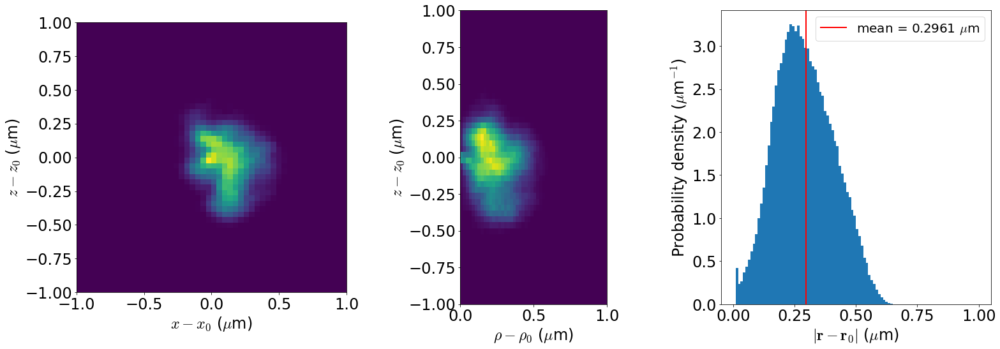

In [18]:
# Testing
data_path = ceph_path / "21-04-23_AMchr1_line512_pin/"
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    sy_dat = h5_data['raw_data']['sylinders'][...]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    _ = aa.make_segment_distr_graphs(com_arr, [], [0,1], 1,2)

## End-to-End Displacement

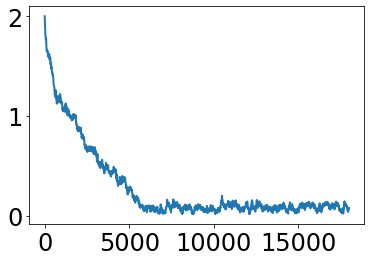

In [19]:
data_path = ws_path / "21-05-07_AMchr1_line100_scan5.1_xl1000-5000/simulations/xl1000/"
ss_ind = 0
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    ee_dist = aa.get_end_end_distance(com_arr)
    
fig, ax = plt.subplots()
_ = ax.plot(time_arr, ee_dist)

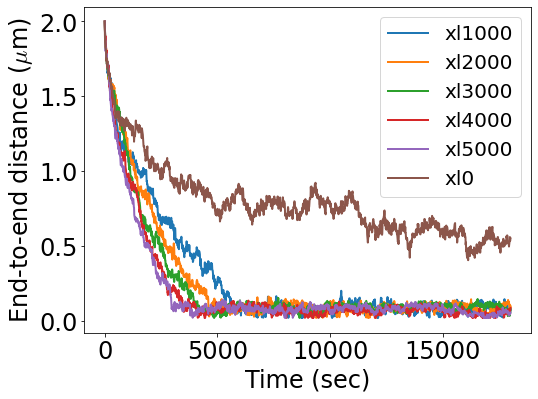

In [20]:
data_path = ws_path / "21-05-07_AMchr1_line100_scan5.1_xl1000-5000/simulations/"
ss_ind = 0
fig, ax = plt.subplots(figsize=(8,6))
for h5_path in data_path.glob('**/*.h5'):
    with h5py.File(h5_path, 'r+') as h5_data:
        time_arr = h5_data['time'][ss_ind:]
        sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
        com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
        ee_dist = aa.get_end_end_distance(com_arr)
    
    _ = ax.plot(time_arr, ee_dist, label=h5_path.stem)
    
_ = ax.set_xlabel('Time (sec)')
_ = ax.set_ylabel('End-to-end distance ($\mu$m)')
_ = ax.legend()

## Radius of gyration

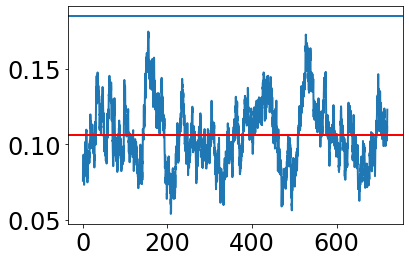

In [21]:
data_path = ws_path / "21-05-12_AMchr1_RS_line512eq_lo0_kl36.50_visc1.0_ts.1/"
#data_path = (ceph_path /"21-05-07_AMchr1_line100_scan5.1_xl1000-5000/simulations/xl1000")
ss_ind = 0
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]
    rog_arr = aa.calc_rad_of_gyration(com_arr)
    ee_dist = aa.get_end_end_distance(com_arr)

fig, ax = plt.subplots()
ax.plot(time_arr, rog_arr)
ax.axhline(np.sqrt(nbeads*.02*.02/6.))
ax.axhline(np.mean(rog_arr), c='r')
#ax.plot(time_arr, ee_dist)
#plt.axhline(np.mean(rog_arr))

## Nearest neighbors

[181 228 229 230]
[330 283 282 281]


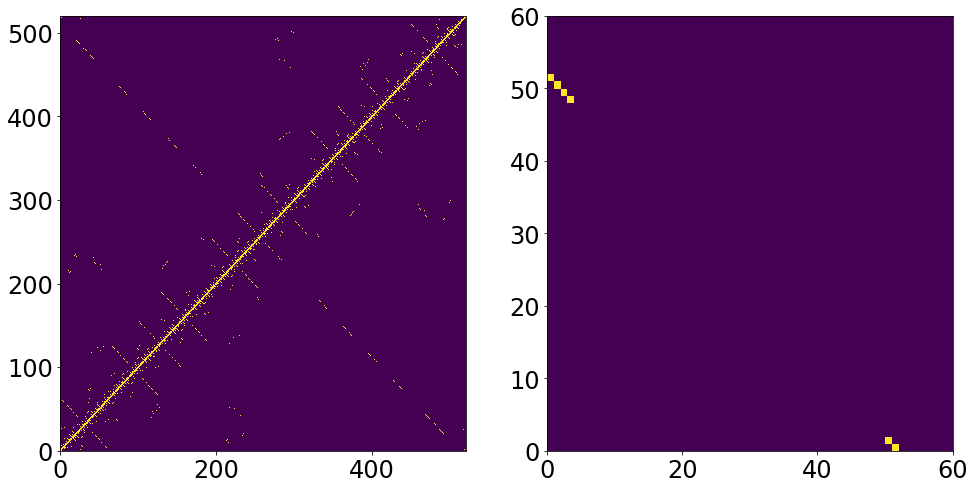

In [22]:
data_path = ceph_path / "21-04-06_AMchr1_loop520_pin_conf.6/"
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    sy_dat = h5_data['raw_data']['sylinders'][...]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    neighbor_mat = aa.find_neighbors(com_arr, .02)
    fig, ax = plt.subplots(1, 2, figsize=(16, 8))
    ax[0].pcolorfast(neighbor_mat)
    start=180
    stop=240
    ax[1].pcolorfast(neighbor_mat[start:stop, -stop:-start])
    x, y = np.where(neighbor_mat)
    x_ind = np.where((x > start) & (x < stop))
    print(x[x_ind][np.where(y[x_ind] > 520-stop)])
    print(y[x_ind][np.where(y[x_ind] > 520-stop)])
    #print(np.where(neighbor_mat))
    

# Data/Results

## 520 loop confinement seed avg

8


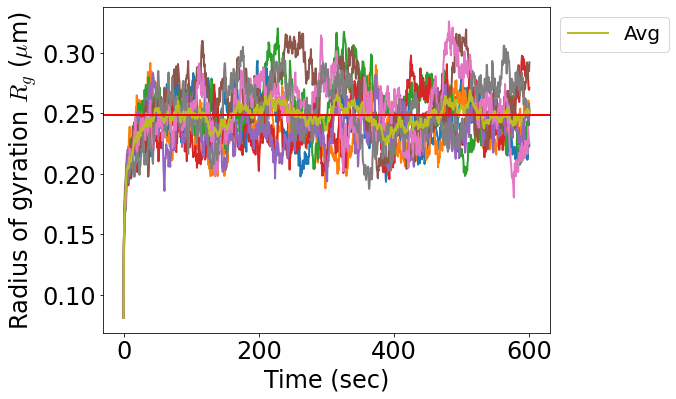

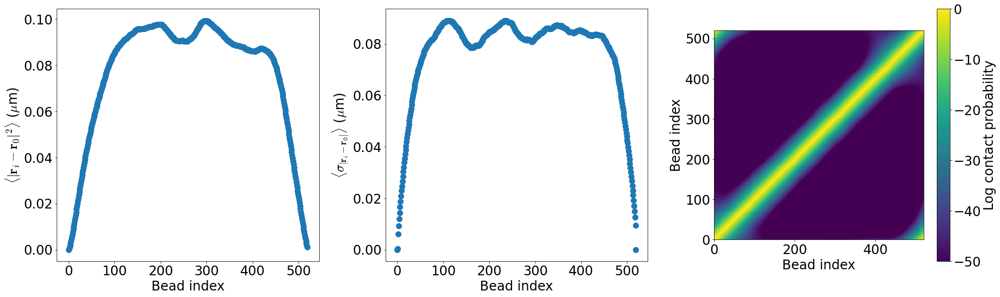

In [24]:
sd_data_paths = list((ceph_path / "21-05-18_AMchr1_scan.8_loop520_pin/simulations/").glob('*/*.h5'))
ss_ind = 0
rog_avg_arr = None
com_arr_tot = None
for h5_path in sd_data_paths:
    with h5py.File(h5_path, 'r+') as h5_data:
        time_arr = h5_data['time'][ss_ind:]
        sy_dat = h5_data['raw_data']['sylinders'][:520,:,ss_ind:]
        com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
        
        if not isinstance(com_arr_tot,np.ndarray):
            com_arr_tot = com_arr[...]
        else:
            com_arr_tot = np.append(com_arr_tot, com_arr, axis=-1)

        if not isinstance(rog_avg_arr, np.ndarray):
            fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
            rog_avg_arr = aa.calc_rad_of_gyration(com_arr)
        else:
            min_len = min(rog_avg_arr.size, com_arr.shape[-1])
            aa.plot_rog_vs_time_graph(ax, time_arr, com_arr)
            rog_avg_arr[:min_len] += aa.calc_rad_of_gyration(com_arr[:,:,:min_len])
            rog_avg_arr = rog_avg_arr[:min_len]
print(len(sd_data_paths))
rog_avg_arr /= len(sd_data_paths)
_ = ax.plot(time_arr[:min_len], rog_avg_arr[:min_len], label='Avg')
_ = ax.axhline(rog_avg_arr[400:min_len].mean(), color='r')
_ = ax.legend(bbox_to_anchor=(1,1), loc='upper left')

log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr_tot, avg_block_step = 4)
fig1, ax1 = aa.make_min_distr_plots(com_arr_tot, log_contact_avg_mat, rel_ind=0, hist_max=1.)


## 520 loop 4000 crowder seed avg

8
0.03616000000000001


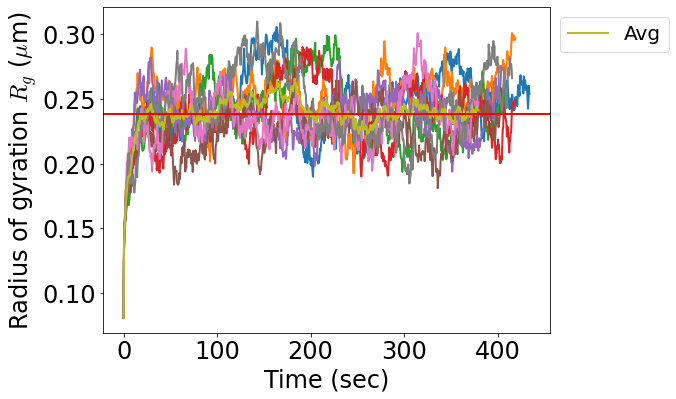

In [25]:
sd_data_paths = list((ceph_path / "21-05-27_AMchr1_scan.8_loop520_pin_crowder4000/simulations/").glob('*/*.h5'))
ss_ind = 0
rog_avg_arr = None
for h5_path in sd_data_paths:
    with h5py.File(h5_path, 'r+') as h5_data:
        time_arr = h5_data['time'][ss_ind:]
        sy_dat = h5_data['raw_data']['sylinders'][:520,:,ss_ind:]
        com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
        if not isinstance(rog_avg_arr, np.ndarray):
            fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
            rog_avg_arr = aa.calc_rad_of_gyration(com_arr)
        else:
            min_len = min(rog_avg_arr.size, com_arr.shape[-1])
            aa.plot_rog_vs_time_graph(ax, time_arr, com_arr)
            rog_avg_arr[:min_len] += aa.calc_rad_of_gyration(com_arr[:,:,:min_len])
            rog_avg_arr = rog_avg_arr[:min_len]
print(len(sd_data_paths))
rog_avg_arr /= len(sd_data_paths)
_ = ax.plot(time_arr[:min_len], rog_avg_arr[:min_len], label='Avg')
_ = ax.axhline(rog_avg_arr[400:min_len].mean(), color='r')
_ = ax.legend(bbox_to_anchor=(1,1), loc='upper left')

packing_fraction = get_pfract(520, .01, 4000, .01, .5)
print(packing_fraction)


## 520 loop 5000 crowder seed avg

8
0.03616000000000001


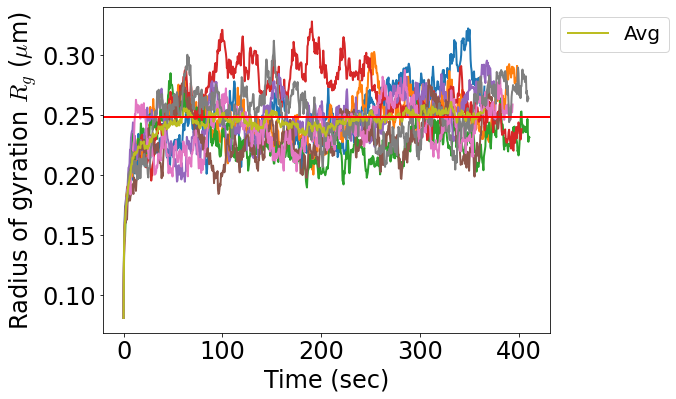

In [26]:
sd_data_paths = list((ceph_path / "21-05-27_AMchr1_scan.8_loop520_pin_crowder5000/simulations/").glob('*/*.h5'))
ss_ind = 0
rog_avg_arr = None
for h5_path in sd_data_paths:
    with h5py.File(h5_path, 'r+') as h5_data:
        time_arr = h5_data['time'][ss_ind:]
        sy_dat = h5_data['raw_data']['sylinders'][:520,:,ss_ind:]
        com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
        if not isinstance(rog_avg_arr, np.ndarray):
            fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
            rog_avg_arr = aa.calc_rad_of_gyration(com_arr)
        else:
            min_len = min(rog_avg_arr.size, com_arr.shape[-1])
            aa.plot_rog_vs_time_graph(ax, time_arr, com_arr)
            rog_avg_arr[:min_len] += aa.calc_rad_of_gyration(com_arr[:,:,:min_len])
            rog_avg_arr = rog_avg_arr[:min_len]
print(len(sd_data_paths))
rog_avg_arr /= len(sd_data_paths)
_ = ax.plot(time_arr[:min_len], rog_avg_arr[:min_len], label='Avg')
_ = ax.axhline(rog_avg_arr[400:min_len].mean(), color='r')
_ = ax.legend(bbox_to_anchor=(1,1), loc='upper left')

packing_fraction = get_pfract(520, .01, 4000, .01, .5)
print(packing_fraction)


## 520 loop 6000 crowder seed avg

8
0.05216000000000001


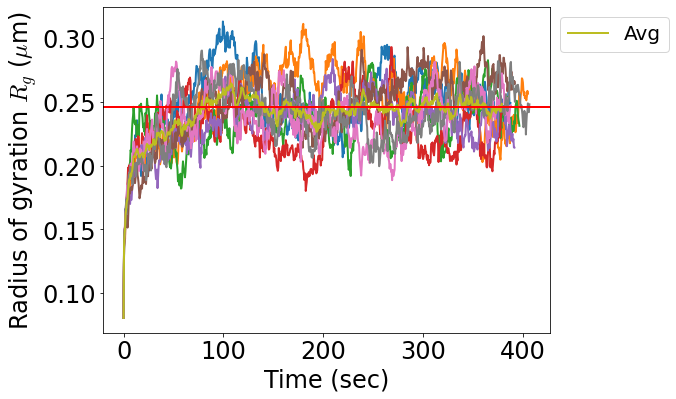

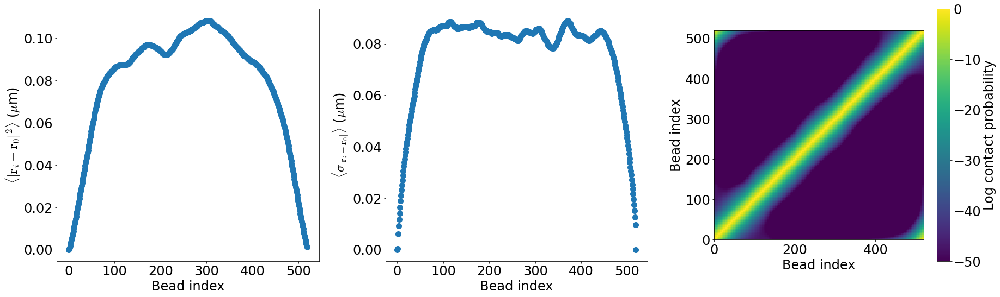

In [27]:
sd_data_paths = list((ceph_path /"21-05-27_AMchr1_scan.8_loop520_pin_crowder6000/simulations/").glob('*/*.h5'))
ss_ind = 0
rog_avg_arr = None
com_arr_tot = None
for h5_path in sd_data_paths:
    with h5py.File(h5_path, 'r+') as h5_data:
        time_arr = h5_data['time'][ss_ind:]
        sy_dat = h5_data['raw_data']['sylinders'][:520,:,ss_ind:]
        com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
        
        if not isinstance(com_arr_tot,np.ndarray):
            com_arr_tot = com_arr[...]
        else:
            com_arr_tot = np.append(com_arr_tot, com_arr, axis=-1)
            
        if not isinstance(rog_avg_arr, np.ndarray):
            fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
            rog_avg_arr = aa.calc_rad_of_gyration(com_arr)
        else:
            min_len = min(rog_avg_arr.size, com_arr.shape[-1])
            aa.plot_rog_vs_time_graph(ax, time_arr, com_arr)
            rog_avg_arr[:min_len] += aa.calc_rad_of_gyration(com_arr[:,:,:min_len])
            rog_avg_arr = rog_avg_arr[:min_len]
print(len(sd_data_paths))
rog_avg_arr /= len(sd_data_paths)
_ = ax.plot(time_arr[:min_len], rog_avg_arr[:min_len], label='Avg')
_ = ax.axhline(rog_avg_arr[400:min_len].mean(), color='r')
_ = ax.legend(bbox_to_anchor=(1,1), loc='upper left')

log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr_tot, avg_block_step = 4)
fig1, ax1 = aa.make_min_distr_plots(com_arr_tot, log_contact_avg_mat, rel_ind=0, hist_max=1.)

packing_fraction = get_pfract(520, .01, 6000, .01, .5)
print(packing_fraction)

## 520 loop 5000 crowder Rad.015 seed avg

1202
1202
1202
1202
1202
1202
7
0.13915999999999998


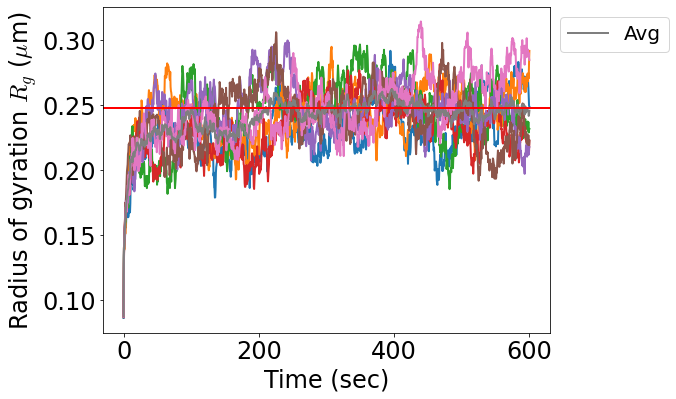

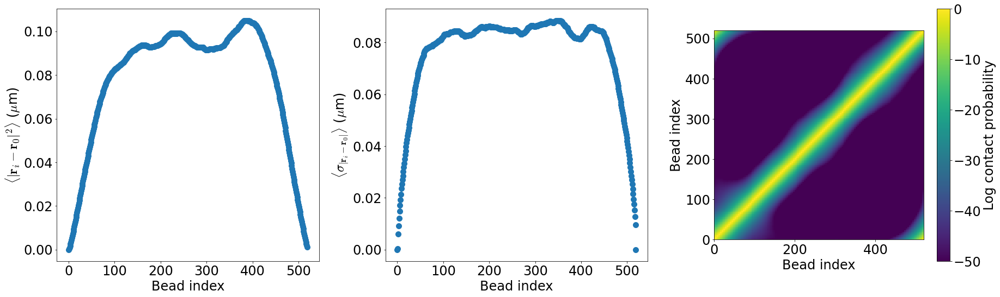

In [28]:
sd_data_paths = list((mnt_path / "21-06-04_AMchr1_scan.8_loop520_pin_crowder5000_crRad.015/simulations/").glob('*/*.h5'))
ss_ind = 0
rog_avg_arr = None
com_arr_tot = None
viable_seeds = 0
for h5_path in sd_data_paths:
    with h5py.File(h5_path, 'r+') as h5_data:
        time_arr = h5_data['time'][ss_ind:]
        sy_dat = h5_data['raw_data']['sylinders'][:520,:,ss_ind:]
        com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
        
        if not isinstance(com_arr_tot,np.ndarray):
            com_arr_tot = com_arr[...]
        else:
            com_arr_tot = np.append(com_arr_tot, com_arr, axis=-1)

        if not isinstance(rog_avg_arr, np.ndarray):
            fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
            rog_avg_arr = aa.calc_rad_of_gyration(com_arr)
        else:
            min_len = min(rog_avg_arr.size, com_arr.shape[-1])
            if min_len < 400:
                continue
            aa.plot_rog_vs_time_graph(ax, time_arr, com_arr)
            rog_avg_arr[:min_len] += aa.calc_rad_of_gyration(com_arr[:,:,:min_len])
            rog_avg_arr = rog_avg_arr[:min_len]
            print(min_len)
        viable_seeds += 1
print(viable_seeds)
rog_avg_arr /= viable_seeds
_ = ax.plot(time_arr[:min_len], rog_avg_arr[:min_len], label='Avg')
_ = ax.axhline(rog_avg_arr[400:min_len].mean(), color='r')
_ = ax.legend(bbox_to_anchor=(1,1), loc='upper left')

log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr_tot, avg_block_step = 4)
fig1, ax1 = aa.make_min_distr_plots(com_arr_tot, log_contact_avg_mat, rel_ind=0, hist_max=1.)

packing_fraction = get_pfract(520, .01, 5000, .015, .5)
print(packing_fraction)


## 520 loop 2000 crowder Rad.02 seed avg

8
0.13216000000000003


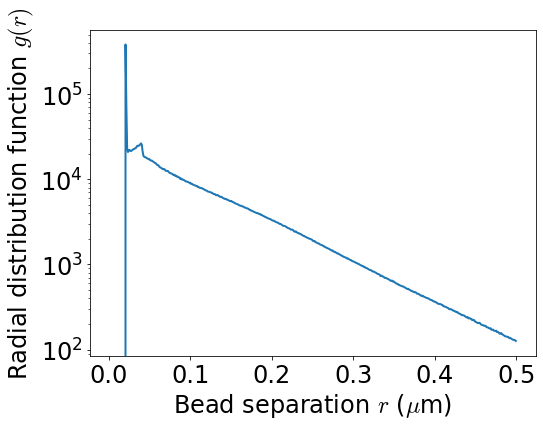

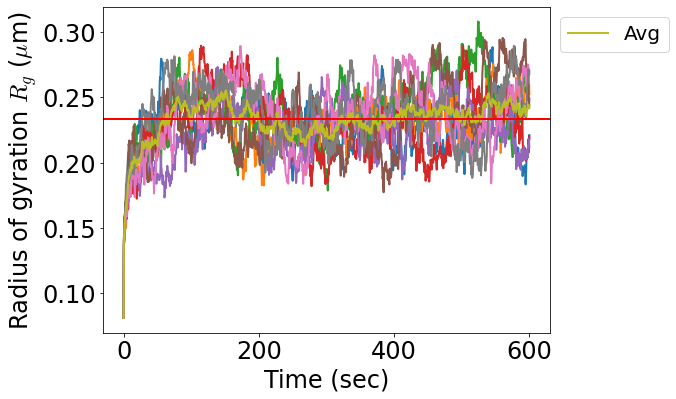

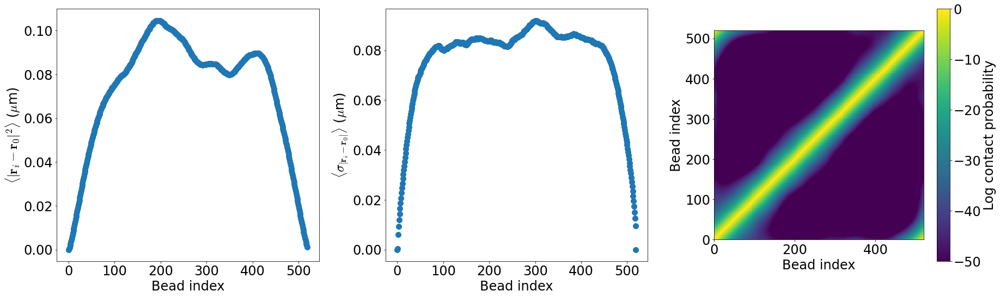

In [77]:
sd_data_paths = list((ceph_path / "21-06-04_AMchr1_scan.8_loop520_pin_crowder2000_crRad.02/simulations/").glob('*/*.h5'))
ss_ind = 0
rog_avg_arr = None
com_arr_tot = None
for h5_path in sd_data_paths:
    with h5py.File(h5_path, 'r+') as h5_data:
        time_arr = h5_data['time'][ss_ind:]
        sy_dat = h5_data['raw_data']['sylinders'][:520,:,ss_ind:]
        com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
        
        if not isinstance(com_arr_tot,np.ndarray):
            com_arr_tot = com_arr[...]
            vol = np.pi*(.5**3)/.75
        else:
            com_arr_tot = np.append(com_arr_tot, com_arr, axis=-1)

        if not isinstance(rog_avg_arr, np.ndarray):
            fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
            rog_avg_arr = aa.calc_rad_of_gyration(com_arr)
        else:
            min_len = min(rog_avg_arr.size, com_arr.shape[-1])
            aa.plot_rog_vs_time_graph(ax, time_arr, com_arr)
            rog_avg_arr[:min_len] += aa.calc_rad_of_gyration(com_arr[:,:,:min_len])
            rog_avg_arr = rog_avg_arr[:min_len]
print(len(sd_data_paths))
rog_avg_arr /= len(sd_data_paths)
_ = ax.plot(time_arr[:min_len], rog_avg_arr[:min_len], label='Avg')
_ = ax.axhline(rog_avg_arr[400:min_len].mean(), color='r')
_ = ax.legend(bbox_to_anchor=(1,1), loc='upper left')

log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr_tot, avg_block_step = 4)
fig1, ax1 = aa.make_min_distr_plots(com_arr_tot, log_contact_avg_mat, rel_ind=0, hist_max=1.)

packing_fraction = get_pfract(520, .01, 2000, .02, .5)
print(packing_fraction)


## 520 loop 4000 crowder Rad.02 seed avg

1202
422
422
422
422
6
0.26016000000000006


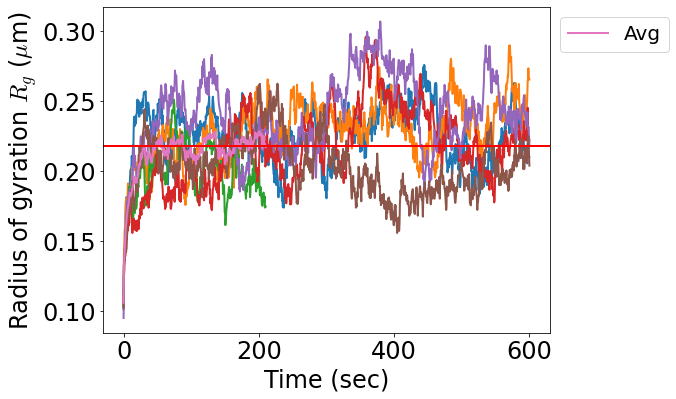

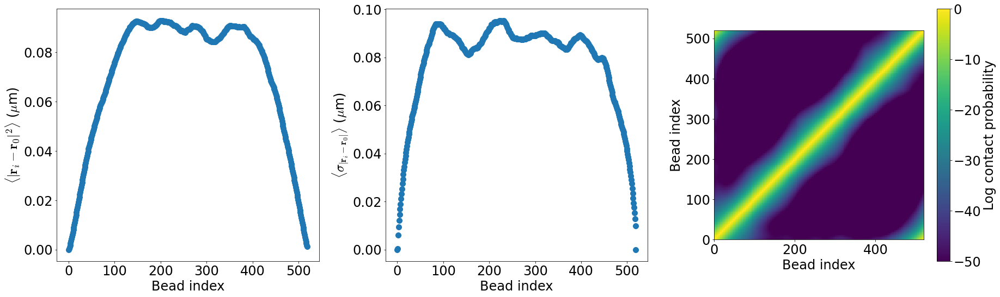

In [31]:
sd_data_paths = list((mnt_path / "21-06-04_AMchr1_scan.8_loop520_pin_crowder4000_crRad.02/simulations/").glob('*/*.h5'))
ss_ind = 0
rog_avg_arr = None
com_arr_tot = None
for h5_path in sd_data_paths:
    with h5py.File(h5_path, 'r+') as h5_data:
        time_arr = h5_data['time'][ss_ind:]
        sy_dat = h5_data['raw_data']['sylinders'][:520,:,ss_ind:]
        com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
        
        if not isinstance(com_arr_tot,np.ndarray):
            com_arr_tot = com_arr[...]
        else:
            com_arr_tot = np.append(com_arr_tot, com_arr, axis=-1)

        if not isinstance(rog_avg_arr, np.ndarray):
            fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
            rog_avg_arr = aa.calc_rad_of_gyration(com_arr)
        else:
            min_len = min(rog_avg_arr.size, com_arr.shape[-1])
            aa.plot_rog_vs_time_graph(ax, time_arr, com_arr)
            rog_avg_arr[:min_len] += aa.calc_rad_of_gyration(com_arr[:,:,:min_len])
            rog_avg_arr = rog_avg_arr[:min_len]
            print(min_len)
print(len(sd_data_paths))
rog_avg_arr /= len(sd_data_paths)

_ = ax.plot(time_arr[:min_len], rog_avg_arr[:min_len], label='Avg')
_ = ax.axhline(rog_avg_arr[100:min_len].mean(), color='r')
_ = ax.legend(bbox_to_anchor=(1,1), loc='upper left')

log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr_tot, avg_block_step = 4)
fig1, ax1 = aa.make_min_distr_plots(com_arr_tot, log_contact_avg_mat, rel_ind=0, hist_max=1.)

packing_fraction = get_pfract(520, .01, 4000, .02, .5)
print(packing_fraction)


## 520 loop 5000 crowder Rad.02 seed avg

8
0.32416000000000006


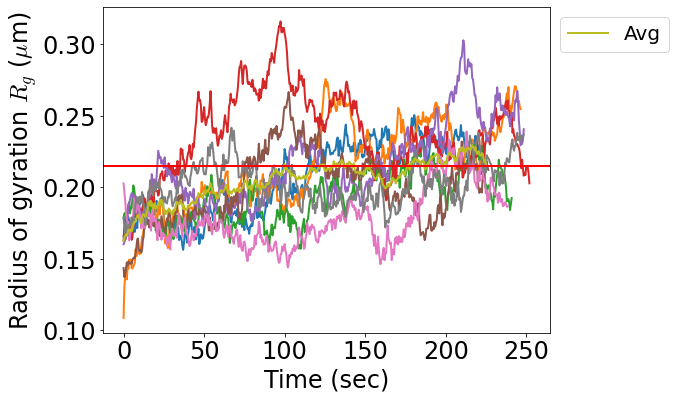

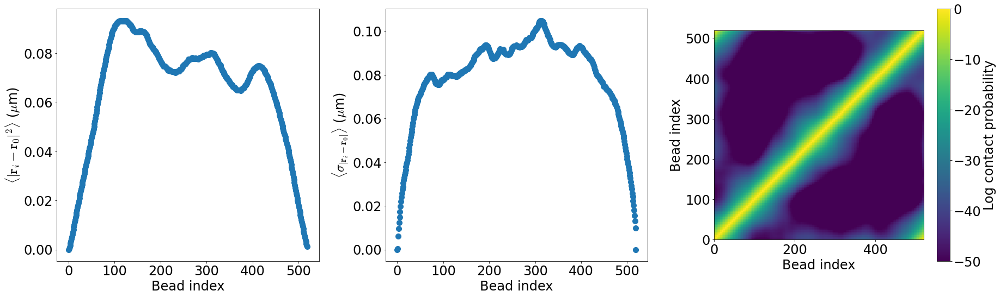

In [32]:
sd_data_paths = list((ceph_path / "21-05-27_AMchr1_scan.8_loop520_pin_crowder5000_crRad.02/simulations/").glob('*/*.h5'))
ss_ind = 0
rog_avg_arr = None
com_arr_tot = None
for h5_path in sd_data_paths:
    with h5py.File(h5_path, 'r+') as h5_data:
        time_arr = h5_data['time'][ss_ind:]
        sy_dat = h5_data['raw_data']['sylinders'][:520,:,ss_ind:]
        com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
        
        if not isinstance(com_arr_tot,np.ndarray):
            com_arr_tot = com_arr[...]
        else:
            com_arr_tot = np.append(com_arr_tot, com_arr, axis=-1)

        if not isinstance(rog_avg_arr, np.ndarray):
            fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
            rog_avg_arr = aa.calc_rad_of_gyration(com_arr)
        else:
            min_len = min(rog_avg_arr.size, com_arr.shape[-1])
            aa.plot_rog_vs_time_graph(ax, time_arr, com_arr)
            rog_avg_arr[:min_len] += aa.calc_rad_of_gyration(com_arr[:,:,:min_len])
            rog_avg_arr = rog_avg_arr[:min_len]
print(len(sd_data_paths))
rog_avg_arr /= len(sd_data_paths)
_ = ax.plot(time_arr[:min_len], rog_avg_arr[:min_len], label='Avg')
_ = ax.axhline(rog_avg_arr[200:min_len].mean(), color='r')
_ = ax.legend(bbox_to_anchor=(1,1), loc='upper left')

log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr_tot, avg_block_step = 4)
fig1, ax1 = aa.make_min_distr_plots(com_arr_tot, log_contact_avg_mat, rel_ind=0, hist_max=1.)

packing_fraction = get_pfract(520, .01, 5000, .02, .5)
print(packing_fraction)


## 520 loop 6000 crowder Rad.005 seed avg

In [ ]:
sd_data_paths = list((ceph_path /"21-05-27_AMchr1_scan.8_loop520_pin_crowder6000_crRad.005/simulations/").glob('*/*.h5'))
ss_ind = 0
rog_avg_arr = None
com_arr_tot = None
for h5_path in sd_data_paths:
    with h5py.File(h5_path, 'r+') as h5_data:
        time_arr = h5_data['time'][ss_ind:]
        sy_dat = h5_data['raw_data']['sylinders'][:520,:,ss_ind:]
        com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
        if not isinstance(com_arr_tot,np.ndarray):
            com_arr_tot = com_arr[...]
        else:
            com_arr_tot = np.append(com_arr_tot, com_arr, axis=-1)
        
        if not isinstance(rog_avg_arr, np.ndarray):
            fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
            rog_avg_arr = aa.calc_rad_of_gyration(com_arr)
        else:
            min_len = min(rog_avg_arr.size, com_arr.shape[-1])
            aa.plot_rog_vs_time_graph(ax, time_arr, com_arr)
            rog_avg_arr[:min_len] += aa.calc_rad_of_gyration(com_arr[:,:,:min_len])
            rog_avg_arr = rog_avg_arr[:min_len]
print(len(sd_data_paths))
rog_avg_arr /= len(sd_data_paths)
_ = ax.plot(time_arr[:min_len], rog_avg_arr[:min_len], label='Avg')
_ = ax.axhline(rog_avg_arr[400:min_len].mean(), color='r')
_ = ax.legend(bbox_to_anchor=(1,1), loc='upper left')



log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr_tot, avg_block_step = 4)
fig1, ax1 = aa.make_min_distr_plots(com_arr_tot, log_contact_avg_mat, rel_ind=0, hist_max=1.)


# 2 Loop analysis

## 1040 2 loop

(<Figure size 1584x576 with 3 Axes>,
 array([<AxesSubplot:xlabel='$x-x_0$ ($\\mu$m)', ylabel='$z-z_0$ ($\\mu$m)'>,
        <AxesSubplot:xlabel='$\\rho - \\rho_0$ ($\\mu$m)', ylabel='$z-z_0$ ($\\mu$m)'>,
        <AxesSubplot:xlabel='$|{\\bf r} - {\\bf r}_0|$ ($\\mu$m)', ylabel='Probability density ($\\mu$m$^{-1}$)'>],
       dtype=object))

AttributeError: module 'amsos_analysis' has no attribute 'make_rouse_analysis_plots'

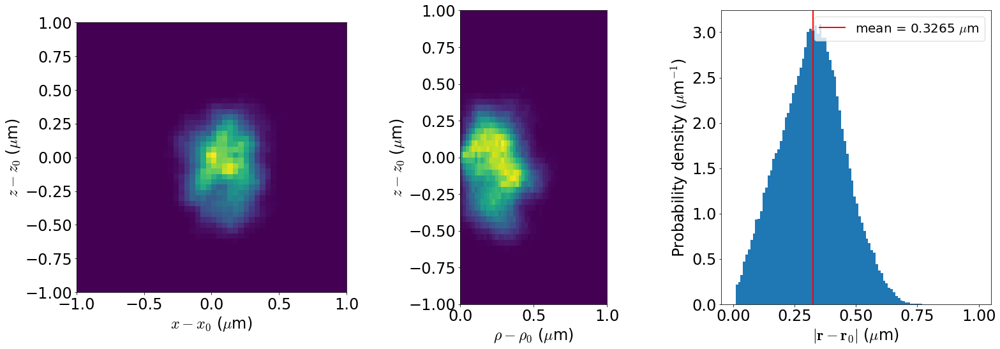

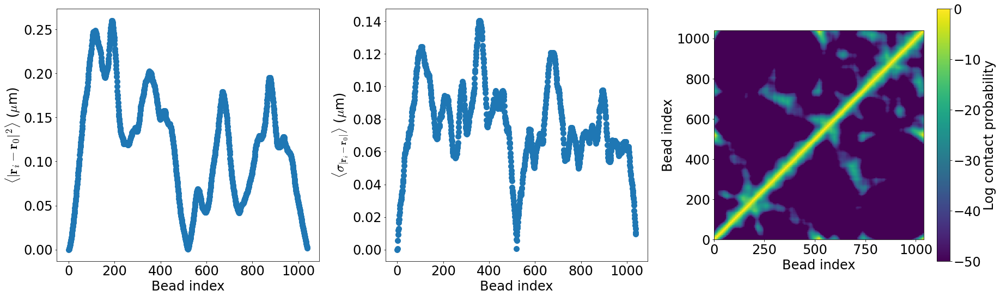

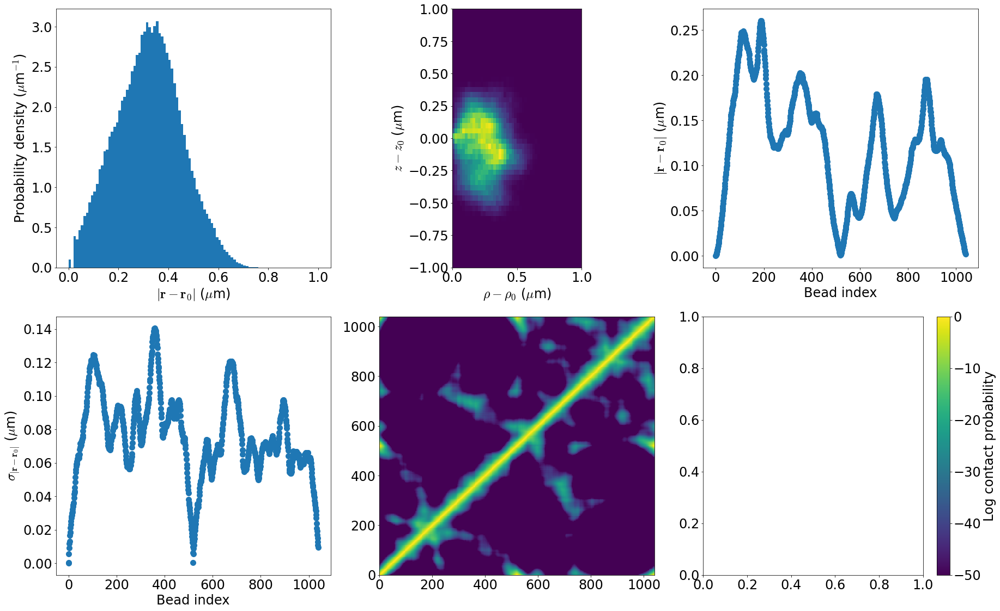

In [82]:
data_path = ceph_path / "21-04-26_AMchr1_2loop1040/"
ss_ind = 0
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    nbeads = com_arr.shape[0]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    mode_mat = aa.get_rouse_modes(com_arr)
    
    ##com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 4)
mode_mat = aa.get_rouse_modes(com_arr)

# Graphing
aa.make_segment_distr_graphs(com_arr, [], [0,1], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
fig2, ax2 = aa.make_total_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
aa.make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=40)

## 2 520 loops seed avg (missing link)

8


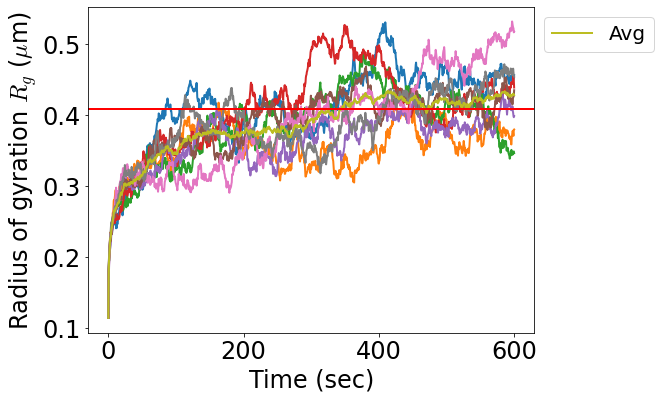

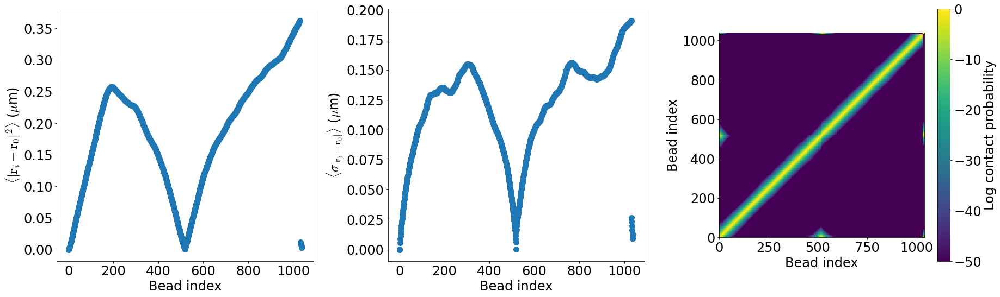

In [34]:
sd_data_paths = list((mnt_path /"21-06-04_AMchr1_scan.8_2loops1040eq_pin/simulations/").glob('*/*.h5'))
ss_ind = 0
rog_avg_arr = None
com_arr_tot = None
for h5_path in sd_data_paths:
    with h5py.File(h5_path, 'r+') as h5_data:
        time_arr = h5_data['time'][ss_ind:]
        sy_dat = h5_data['raw_data']['sylinders'][:1040,:,ss_ind:]
        com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
        if not isinstance(com_arr_tot,np.ndarray):
            com_arr_tot = com_arr[...]
        else:
            com_arr_tot = np.append(com_arr_tot, com_arr, axis=-1)
        
        if not isinstance(rog_avg_arr, np.ndarray):
            fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
            rog_avg_arr = aa.calc_rad_of_gyration(com_arr)
        else:
            min_len = min(rog_avg_arr.size, com_arr.shape[-1])
            aa.plot_rog_vs_time_graph(ax, time_arr, com_arr)
            rog_avg_arr[:min_len] += aa.calc_rad_of_gyration(com_arr[:,:,:min_len])
            rog_avg_arr = rog_avg_arr[:min_len]
print(len(sd_data_paths))
rog_avg_arr /= len(sd_data_paths)
_ = ax.plot(time_arr[:min_len], rog_avg_arr[:min_len], label='Avg')
_ = ax.axhline(rog_avg_arr[400:min_len].mean(), color='r')
_ = ax.legend(bbox_to_anchor=(1,1), loc='upper left')



log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr_tot, avg_block_step = 4)
fig1, ax1 = aa.make_min_distr_plots(com_arr_tot, log_contact_avg_mat, rel_ind=0, hist_max=1.)


## 2 520 loops seed avg

s3
s7
s2
s5
s6
s4
s8
7


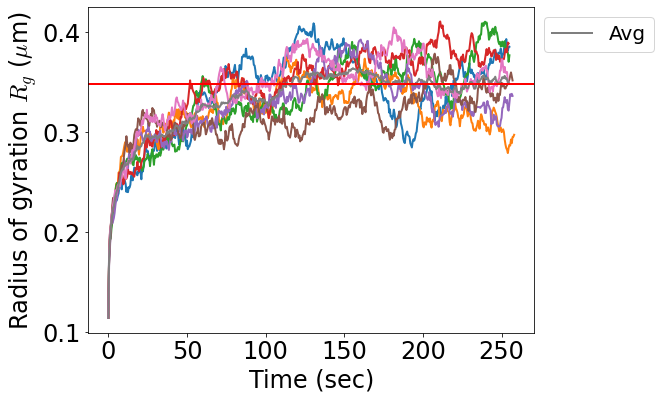

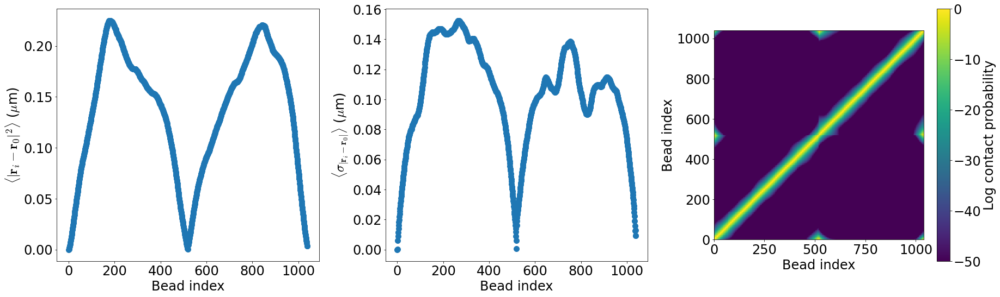

In [40]:
sd_data_paths = list((mnt_path /"21-06-15_AMchr1_scan.8_2loops1040eq_pin/simulations/").glob('*/*.h5'))
ss_ind = 0
rog_avg_arr = None
com_arr_tot = None
for h5_path in sd_data_paths:
    with h5py.File(h5_path, 'r+') as h5_data:
        time_arr = h5_data['time'][ss_ind:]
        sy_dat = h5_data['raw_data']['sylinders'][:1040,:,ss_ind:]
        com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
        
        if not isinstance(com_arr_tot,np.ndarray):
            com_arr_tot = com_arr[...]
        else:
            com_arr_tot = np.append(com_arr_tot, com_arr, axis=-1)
        
        if not isinstance(rog_avg_arr, np.ndarray):
            fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
            rog_avg_arr = aa.calc_rad_of_gyration(com_arr)
        else:
            min_len = min(rog_avg_arr.size, com_arr.shape[-1])
            aa.plot_rog_vs_time_graph(ax, time_arr, com_arr)
            rog_avg_arr[:min_len] += aa.calc_rad_of_gyration(com_arr[:,:,:min_len])
            rog_avg_arr = rog_avg_arr[:min_len]
print(len(sd_data_paths))
rog_avg_arr /= len(sd_data_paths)
_ = ax.plot(time_arr[:min_len], rog_avg_arr[:min_len], label='Avg')
_ = ax.axhline(rog_avg_arr[400:min_len].mean(), color='r')
_ = ax.legend(bbox_to_anchor=(1,1), loc='upper left')



log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr_tot, avg_block_step = 4)
fig1, ax1 = aa.make_min_distr_plots(com_arr_tot, log_contact_avg_mat, rel_ind=0, hist_max=1.)


## 2 520 loops 4000 crowders Rad.02 seed avg (missing link)

8


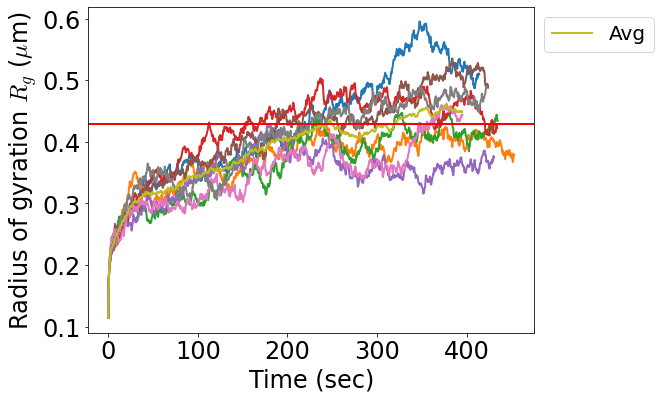

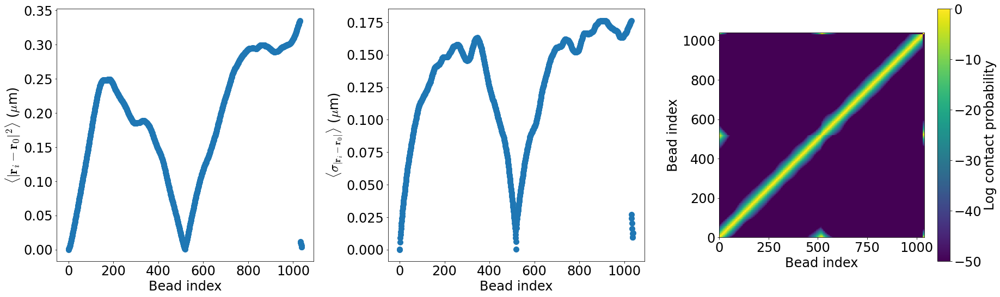

In [81]:
sd_data_paths = list((mnt_path /"21-06-04_AMchr1_scan.8_2loops1040eq_pin_crowder4000_crRad.02/simulations/").glob('*/*.h5'))
ss_ind = 0
rog_avg_arr = None
com_arr_tot = None
for h5_path in sd_data_paths:
    with h5py.File(h5_path, 'r+') as h5_data:
        time_arr = h5_data['time'][ss_ind:]
        sy_dat = h5_data['raw_data']['sylinders'][:1040,:,ss_ind:]
        com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
        
        if not isinstance(com_arr_tot,np.ndarray):
            com_arr_tot = com_arr[...]
        else:
            com_arr_tot = np.append(com_arr_tot, com_arr, axis=-1)
        
        if not isinstance(rog_avg_arr, np.ndarray):
            fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
            rog_avg_arr = aa.calc_rad_of_gyration(com_arr)
        else:
            min_len = min(rog_avg_arr.size, com_arr.shape[-1])
            aa.plot_rog_vs_time_graph(ax, time_arr, com_arr)
            rog_avg_arr[:min_len] += aa.calc_rad_of_gyration(com_arr[:,:,:min_len])
            rog_avg_arr = rog_avg_arr[:min_len]
print(len(sd_data_paths))
rog_avg_arr /= len(sd_data_paths)
_ = ax.plot(time_arr[:min_len], rog_avg_arr[:min_len], label='Avg')
_ = ax.axhline(rog_avg_arr[400:min_len].mean(), color='r')
_ = ax.legend(bbox_to_anchor=(1,1), loc='upper left')



log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr_tot, avg_block_step = 4)
fig1, ax1 = aa.make_min_distr_plots(com_arr_tot, log_contact_avg_mat, rel_ind=0, hist_max=1.)


# Summed contact kymo

<ipython-input-180-87f06b950153>:7: RuntimeWarning: divide by zero encountered in log
  c0 = axarr[0].pcolorfast(X, Y, np.log(contact_mat[:,:,-1]), vmin=-50)


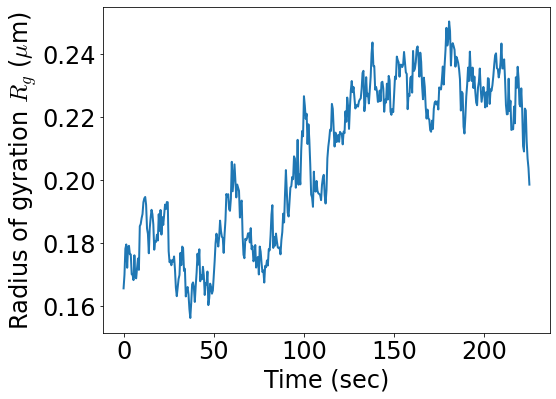

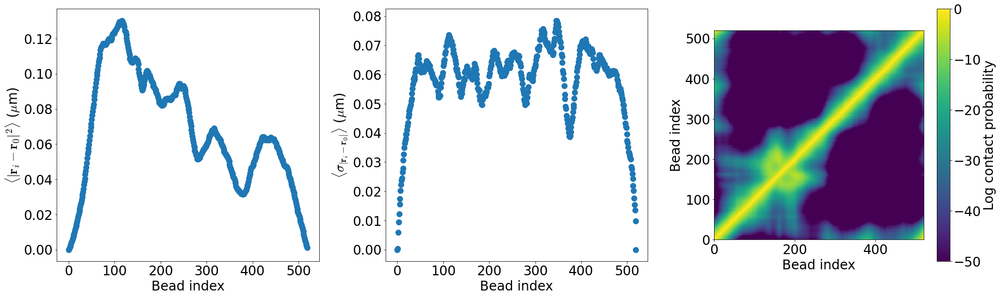

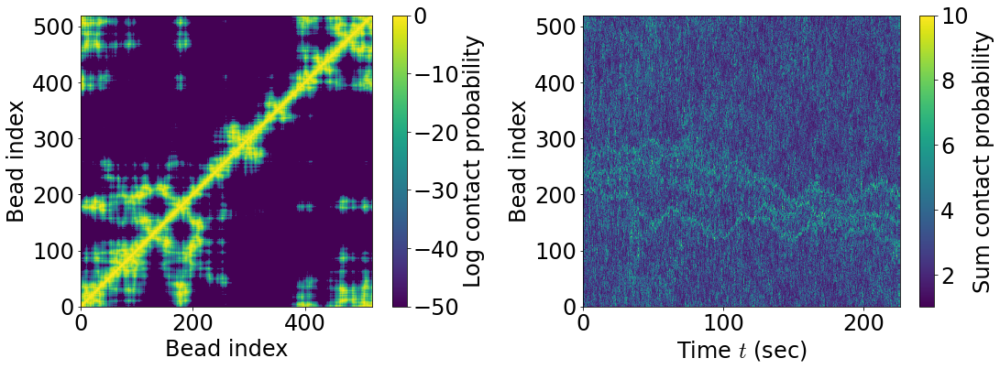

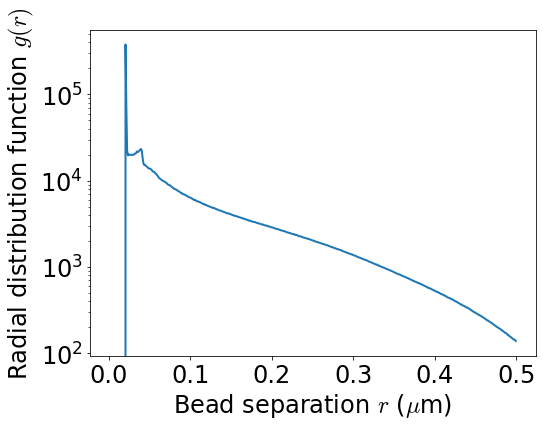

In [193]:
sd_data_path = list((ceph_path / "21-05-27_AMchr1_scan.8_loop520_pin_crowder5000_crRad.02/simulations/").glob('*/*.h5'))[0]
ss_ind = -200
with h5py.File(sd_data_path, 'r') as h5_data:
    time_arr = h5_data['time'][:]
    sy_dat = h5_data['raw_data']['sylinders'][:520,:,:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    
    fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
    
    log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr[:,:,ss_ind:], avg_block_step = 4)
    fig1, ax1 = aa.make_min_distr_plots(com_arr[:,:,ss_ind:], log_contact_avg_mat, rel_ind=0, hist_max=1.)
    
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, bead_range=[0,520])
    contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
    fig2, axarr2, contact_kymo = make_summed_contact_kymo_graph(contact_mat, time_arr)
    
    vol = np.pi*(.5**3)/.75
    fig3, ax3, rad_distr_func, rad_arr = make_rad_distr_func_graph(sep_dist_mat[ss_ind:], system_volume=vol)

<ipython-input-180-87f06b950153>:7: RuntimeWarning: divide by zero encountered in log
  c0 = axarr[0].pcolorfast(X, Y, np.log(contact_mat[:,:,-1]), vmin=-50)


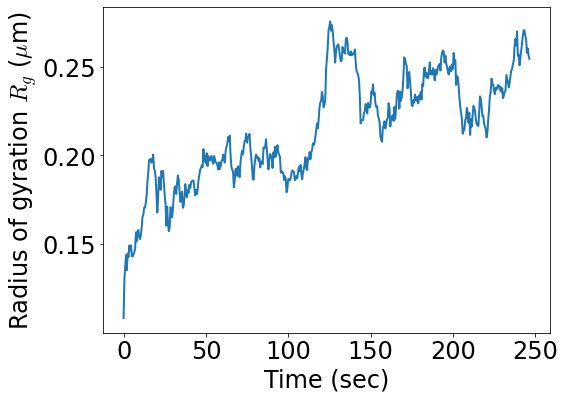

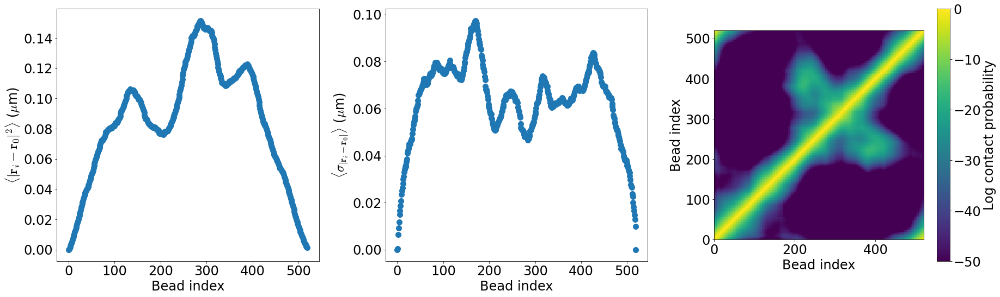

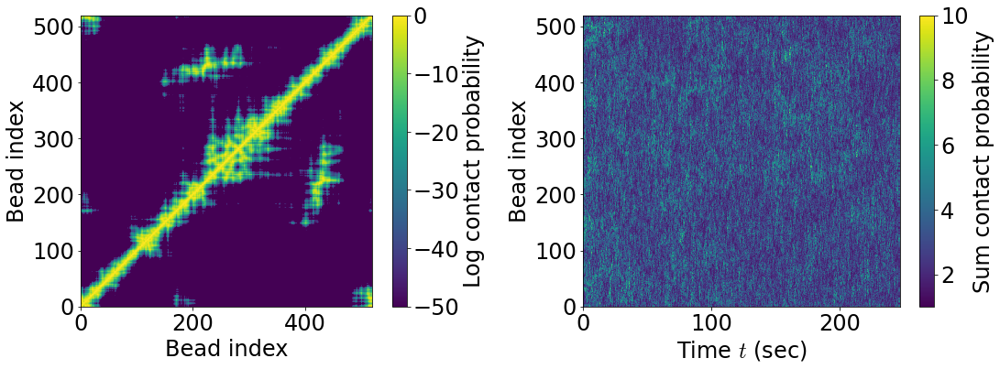

In [183]:
sd_data_path = list((ceph_path / "21-05-27_AMchr1_scan.8_loop520_pin_crowder5000_crRad.02/simulations/").glob('*/*.h5'))[1]
ss_ind = 100
with h5py.File(sd_data_path, 'r') as h5_data:
    time_arr = h5_data['time'][:]
    sy_dat = h5_data['raw_data']['sylinders'][:520,:,:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    
    fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
    
    log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr[:,:,ss_ind:], avg_block_step = 4)
    fig1, ax1 = aa.make_min_distr_plots(com_arr[:,:,ss_ind:], log_contact_avg_mat, rel_ind=0, hist_max=1.)
    
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, bead_range=[0,520])
    contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
    fig2, axarr2, contact_kymo = make_summed_contact_kymo_graph(contact_mat, time_arr)


<ipython-input-180-87f06b950153>:7: RuntimeWarning: divide by zero encountered in log
  c0 = axarr[0].pcolorfast(X, Y, np.log(contact_mat[:,:,-1]), vmin=-50)


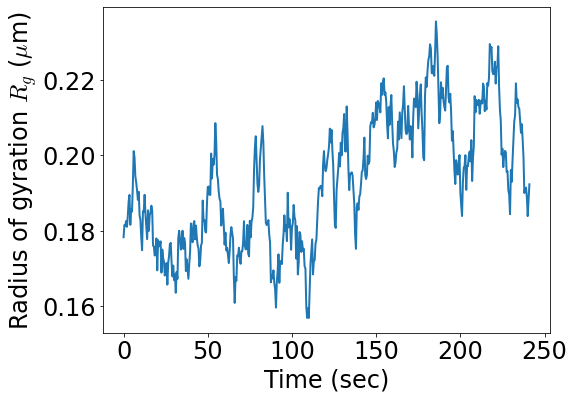

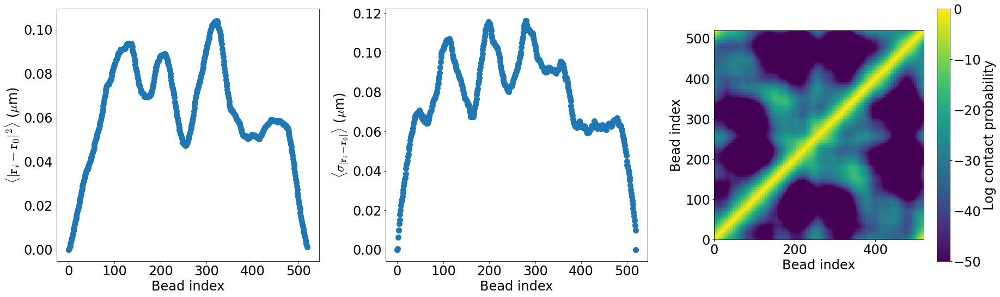

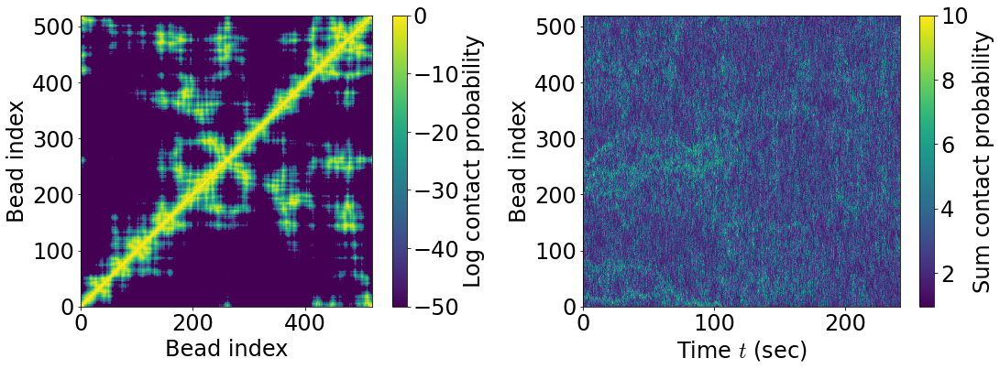

In [184]:
sd_data_path = list((ceph_path / "21-05-27_AMchr1_scan.8_loop520_pin_crowder5000_crRad.02/simulations/").glob('*/*.h5'))[2]
ss_ind = 100
with h5py.File(sd_data_path, 'r') as h5_data:
    time_arr = h5_data['time'][:]
    sy_dat = h5_data['raw_data']['sylinders'][:520,:,:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
    
    log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr[:,:,ss_ind:], avg_block_step = 4)
    fig1, ax1 = aa.make_min_distr_plots(com_arr[:,:,ss_ind:], log_contact_avg_mat, rel_ind=0, hist_max=1.)
    
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, bead_range=[0,520])
    contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
    fig2, axarr2, contact_kymo = make_summed_contact_kymo_graph(contact_mat, time_arr)

<ipython-input-180-87f06b950153>:7: RuntimeWarning: divide by zero encountered in log
  c0 = axarr[0].pcolorfast(X, Y, np.log(contact_mat[:,:,-1]), vmin=-50)


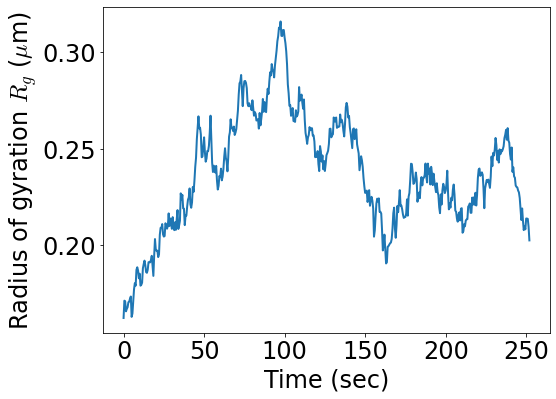

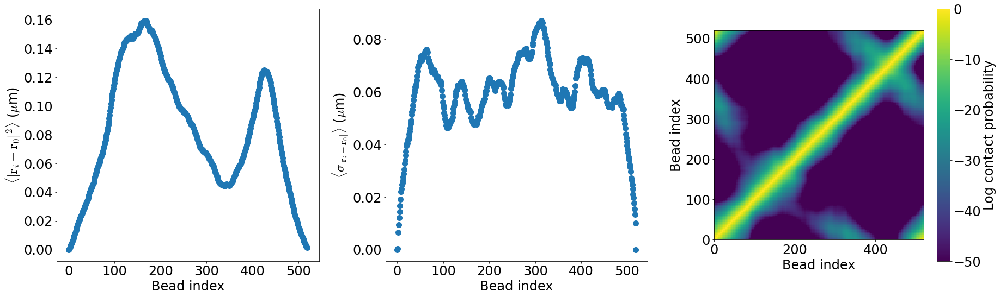

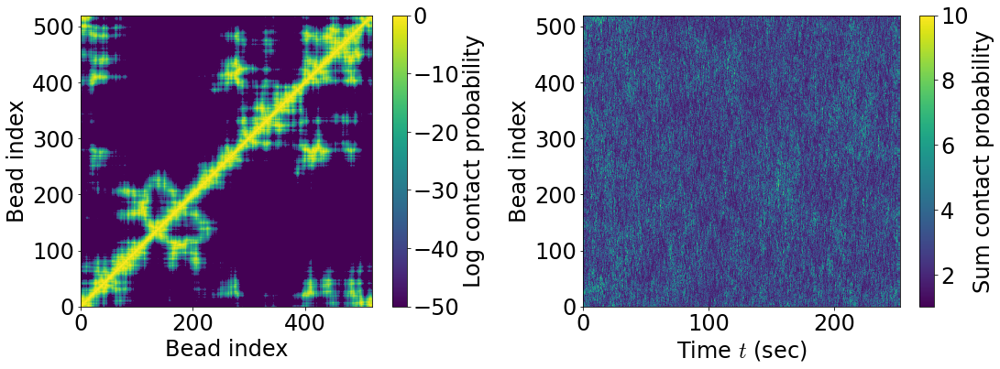

In [185]:
sd_data_path = list((ceph_path / "21-05-27_AMchr1_scan.8_loop520_pin_crowder5000_crRad.02/simulations/").glob('*/*.h5'))[3]
ss_ind = 100
with h5py.File(sd_data_path, 'r') as h5_data:
    time_arr = h5_data['time'][:]
    sy_dat = h5_data['raw_data']['sylinders'][:520,:,:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
    
    log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr[:,:,ss_ind:], avg_block_step = 4)
    fig1, ax1 = aa.make_min_distr_plots(com_arr[:,:,ss_ind:], log_contact_avg_mat, rel_ind=0, hist_max=1.)
    
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, bead_range=[0,520])
    contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
    fig2, axarr2, contact_kymo = make_summed_contact_kymo_graph(contact_mat, time_arr)


<ipython-input-152-55fdfea51329>:18: RuntimeWarning: divide by zero encountered in log
  c2 = axarr2[0].pcolorfast(X, Y, np.log(contact_mat[:,:,-1]), vmin=-50)


Text(0.5, 0, 'Bead index')

Text(0, 0.5, 'Bead index')

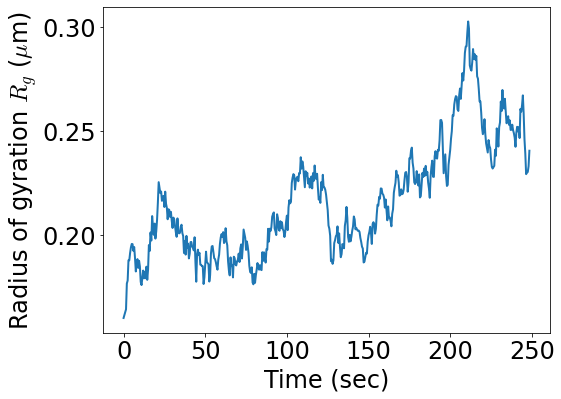

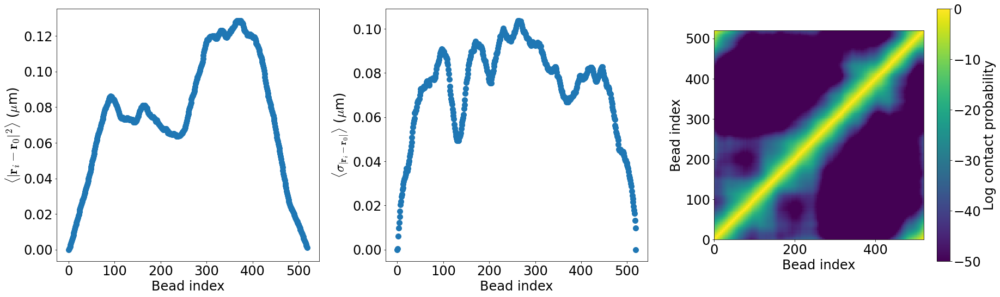

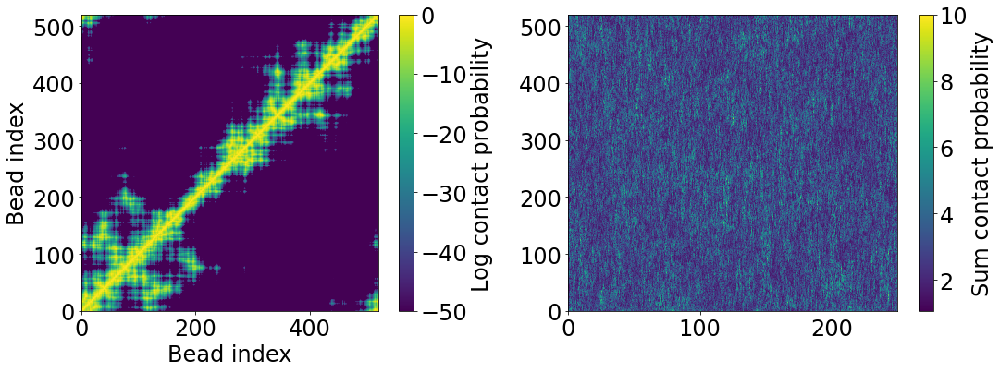

In [152]:
sd_data_path = list((ceph_path / "21-05-27_AMchr1_scan.8_loop520_pin_crowder5000_crRad.02/simulations/").glob('*/*.h5'))[4]
ss_ind = 100
with h5py.File(sd_data_path, 'r') as h5_data:
    time_arr = h5_data['time'][:]
    sy_dat = h5_data['raw_data']['sylinders'][:520,:,:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, bead_range=[0,520])
    contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
    
    log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr[:,:,ss_ind:], avg_block_step = 4)
    fig1, ax1 = aa.make_min_distr_plots(com_arr[:,:,ss_ind:], log_contact_avg_mat, rel_ind=0, hist_max=1.)
    
    fig2, axarr2 = plt.subplots(1,2, figsize=(16,6))
    nbeads = com_arr.shape[0]
    x = np.arange(nbeads + 1)[::int((nbeads) / contact_mat.shape[0])]
    X, Y = np.meshgrid(x, x)
    c2 = axarr2[0].pcolorfast(X, Y, np.log(contact_mat[:,:,-1]), vmin=-50)
    axarr2[0].set_aspect('equal')
    fig2.colorbar(c2, ax=axarr2[0], label="Log contact probability")
    axarr2[0].set_xlabel(r'Bead index')
    axarr2[0].set_ylabel(r'Bead index')
    #fig2.tight_layout()

    #fig3, ax3 = plt.subplots(figsize=(8,6))
    contact_kymo = np.sum(contact_mat, axis=0)-1
    y = np.arange(contact_kymo.shape[0]+1)
    x = np.arange(contact_kymo.shape[1]+1)*(time_arr[2]-time_arr[1])
    X, Y = np.meshgrid(x,y)  
    #c3 = axarr2[1].pcolorfast(X,Y, np.log(contact_kymo))
    #fig2.colorbar(c3, ax=axarr2[1], label="Log sum contact \n probability")
    c3 = axarr2[1].pcolorfast(X,Y, contact_kymo, vmax=10)
    fig2.colorbar(c3, ax=axarr2[1], label="Sum contact probability")
    fig2.tight_layout()


<ipython-input-153-ab6bf73bdb34>:18: RuntimeWarning: divide by zero encountered in log
  c2 = axarr2[0].pcolorfast(X, Y, np.log(contact_mat[:,:,-1]), vmin=-50)


Text(0.5, 0, 'Bead index')

Text(0, 0.5, 'Bead index')

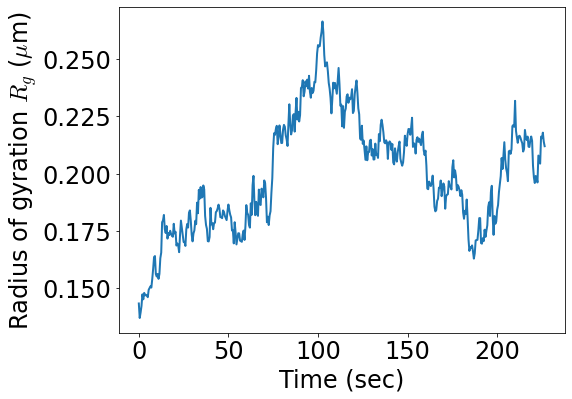

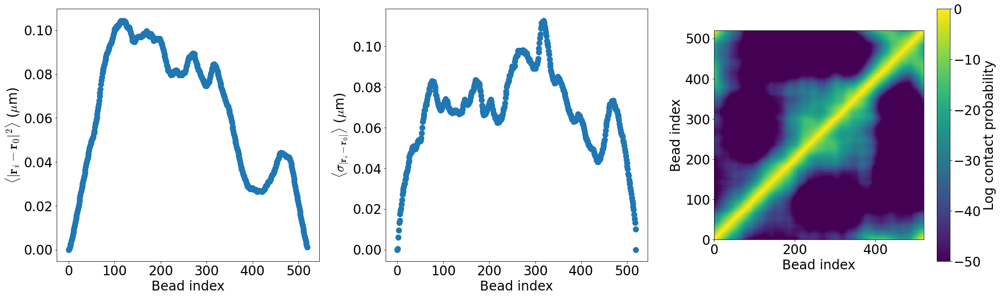

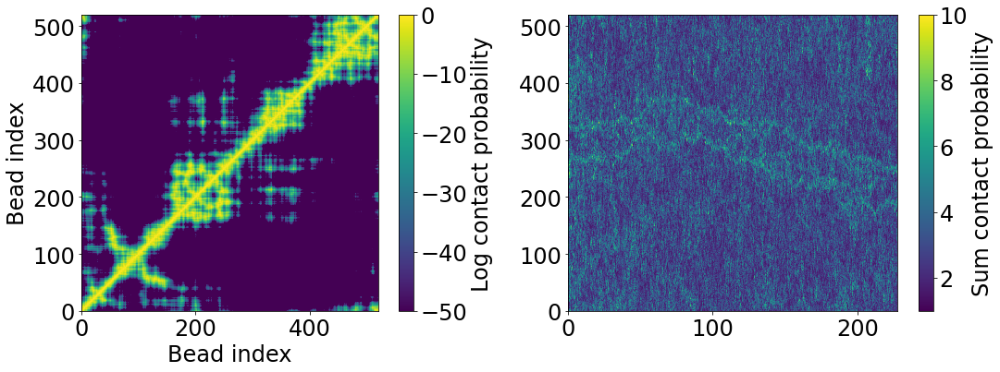

In [153]:
sd_data_path = list((ceph_path / "21-05-27_AMchr1_scan.8_loop520_pin_crowder5000_crRad.02/simulations/").glob('*/*.h5'))[5]
ss_ind = 100
with h5py.File(sd_data_path, 'r') as h5_data:
    time_arr = h5_data['time'][:]
    sy_dat = h5_data['raw_data']['sylinders'][:520,:,:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, bead_range=[0,520])
    contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
    
    log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr[:,:,ss_ind:], avg_block_step = 4)
    fig1, ax1 = aa.make_min_distr_plots(com_arr[:,:,ss_ind:], log_contact_avg_mat, rel_ind=0, hist_max=1.)
    
    fig2, axarr2 = plt.subplots(1,2, figsize=(16,6))
    nbeads = com_arr.shape[0]
    x = np.arange(nbeads + 1)[::int((nbeads) / contact_mat.shape[0])]
    X, Y = np.meshgrid(x, x)
    c2 = axarr2[0].pcolorfast(X, Y, np.log(contact_mat[:,:,-1]), vmin=-50)
    axarr2[0].set_aspect('equal')
    fig2.colorbar(c2, ax=axarr2[0], label="Log contact probability")
    axarr2[0].set_xlabel(r'Bead index')
    axarr2[0].set_ylabel(r'Bead index')
    #fig2.tight_layout()

    #fig3, ax3 = plt.subplots(figsize=(8,6))
    contact_kymo = np.sum(contact_mat, axis=0)-1
    y = np.arange(contact_kymo.shape[0]+1)
    x = np.arange(contact_kymo.shape[1]+1)*(time_arr[2]-time_arr[1])
    X, Y = np.meshgrid(x,y)  
    #c3 = axarr2[1].pcolorfast(X,Y, np.log(contact_kymo))
    #fig2.colorbar(c3, ax=axarr2[1], label="Log sum contact \n probability")
    c3 = axarr2[1].pcolorfast(X,Y, contact_kymo, vmax=10)
    fig2.colorbar(c3, ax=axarr2[1], label="Sum contact probability")
    fig2.tight_layout()


<ipython-input-180-87f06b950153>:7: RuntimeWarning: divide by zero encountered in log
  c0 = axarr[0].pcolorfast(X, Y, np.log(contact_mat[:,:,-1]), vmin=-50)


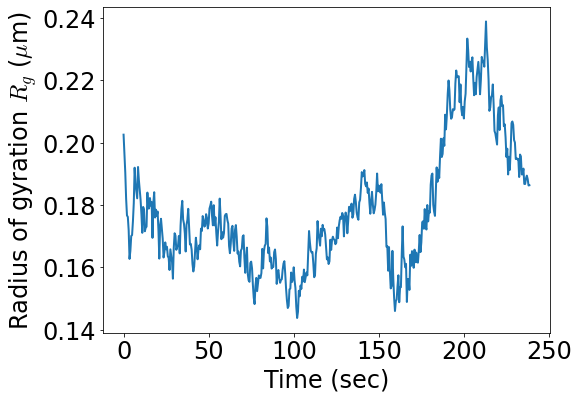

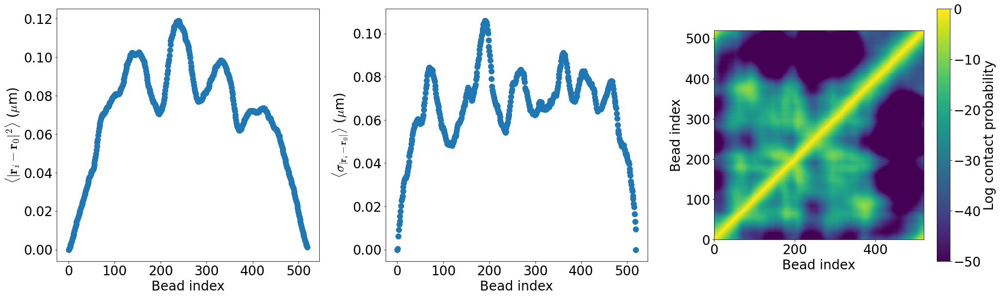

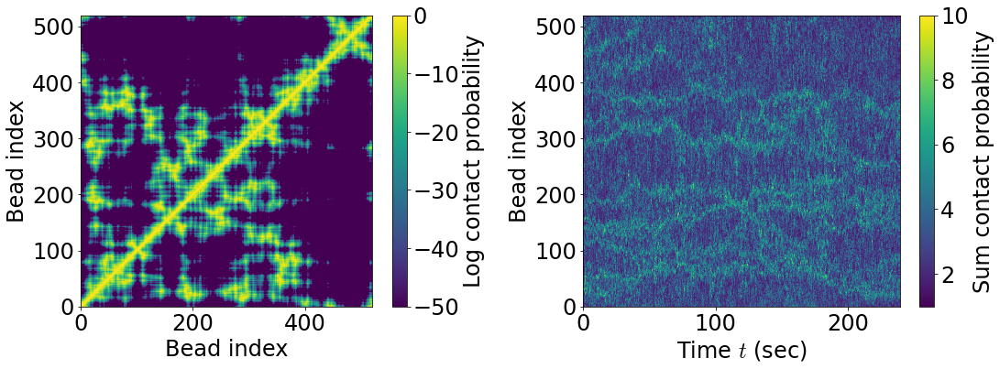

In [187]:
sd_data_path = list((ceph_path / "21-05-27_AMchr1_scan.8_loop520_pin_crowder5000_crRad.02/simulations/").glob('*/*.h5'))[6]
ss_ind = 100
with h5py.File(sd_data_path, 'r') as h5_data:
    time_arr = h5_data['time'][:]
    sy_dat = h5_data['raw_data']['sylinders'][:520,:,:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
    
    log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr[:,:,ss_ind:], avg_block_step = 4)
    fig1, ax1 = aa.make_min_distr_plots(com_arr[:,:,ss_ind:], log_contact_avg_mat, rel_ind=0, hist_max=1.)
    
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, bead_range=[0,520])
    contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
    fig2, axarr2, contact_kymo = make_summed_contact_kymo_graph(contact_mat, time_arr)


<ipython-input-180-87f06b950153>:7: RuntimeWarning: divide by zero encountered in log
  c0 = axarr[0].pcolorfast(X, Y, np.log(contact_mat[:,:,-1]), vmin=-50)


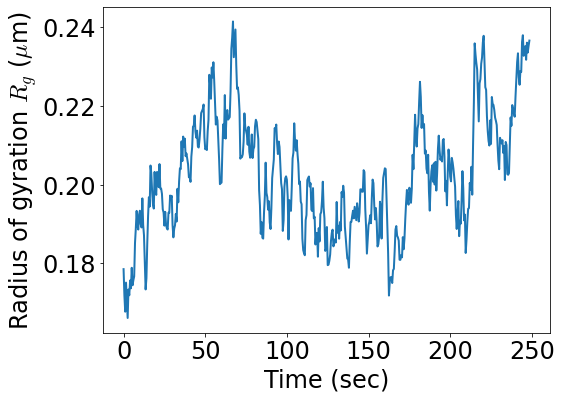

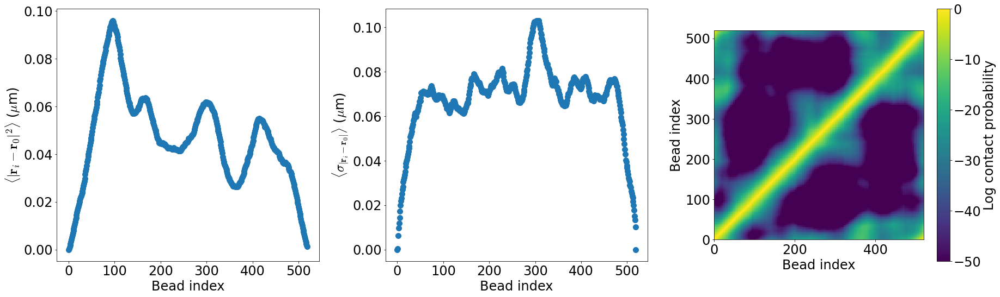

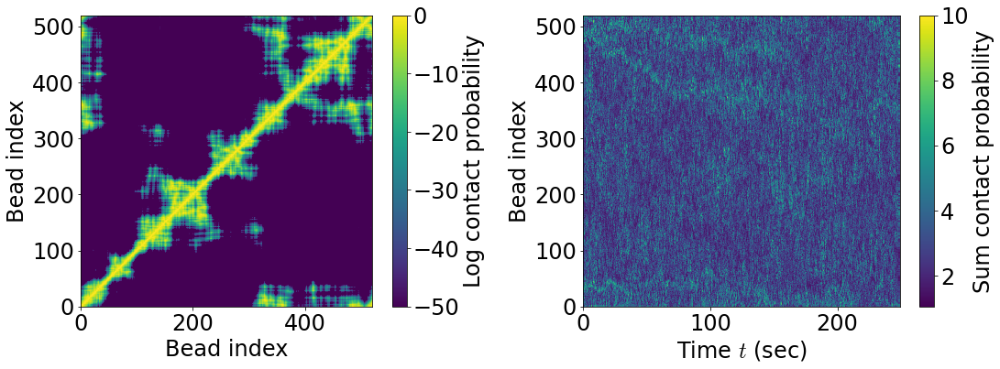

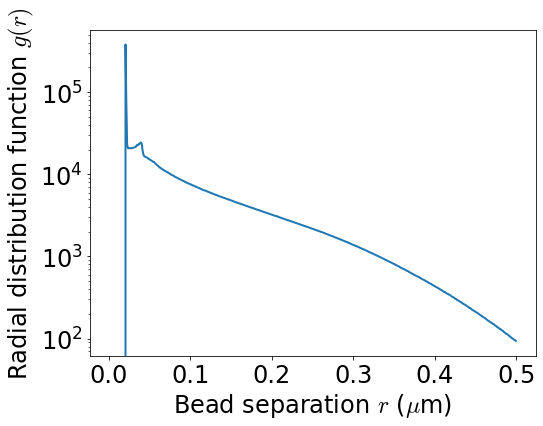

In [190]:
sd_data_path = list((ceph_path / "21-05-27_AMchr1_scan.8_loop520_pin_crowder5000_crRad.02/simulations/").glob('*/*.h5'))[7]
ss_ind = 100
with h5py.File(sd_data_path, 'r') as h5_data:
    time_arr = h5_data['time'][:]
    sy_dat = h5_data['raw_data']['sylinders'][:520,:,:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    
    fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
    
    log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr[:,:,ss_ind:], avg_block_step = 4)
    fig1, ax1 = aa.make_min_distr_plots(com_arr[:,:,ss_ind:], log_contact_avg_mat, rel_ind=0, hist_max=1.)
    
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, bead_range=[0,520])
    contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
    fig2, axarr2, contact_kymo = make_summed_contact_kymo_graph(contact_mat, time_arr)
    
    vol = np.pi*(.5**3)/.75
    fig3, ax3, rad_distr_func, rad_arr = make_rad_distr_func_graph(sep_dist_mat, system_volume=vol)


<ipython-input-157-b3092a530cfe>:18: RuntimeWarning: divide by zero encountered in log
  c2 = axarr2[0].pcolorfast(X, Y, np.log(contact_mat[:,:,-1]), vmin=-50)


Text(0.5, 0, 'Bead index')

Text(0, 0.5, 'Bead index')

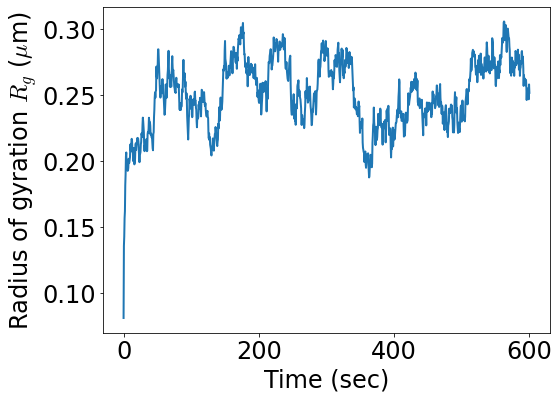

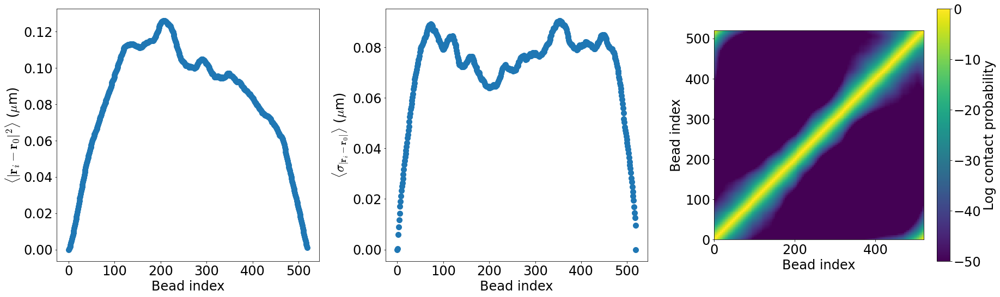

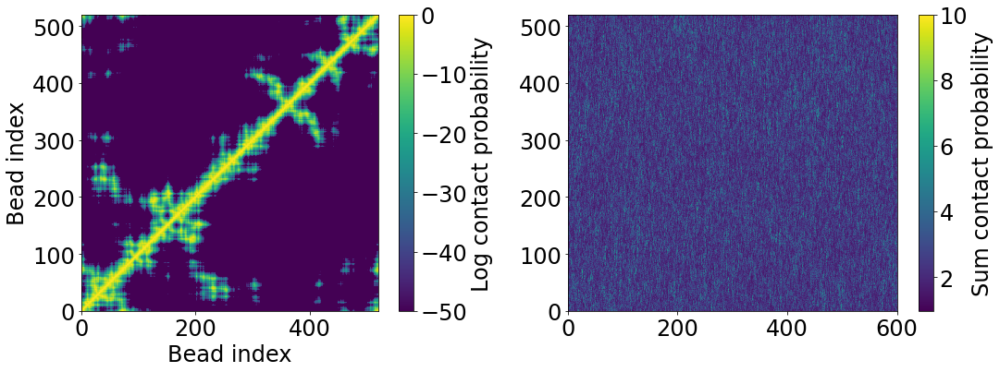

In [157]:
sd_data_path = list((ceph_path / "21-05-18_AMchr1_scan.8_loop520_pin/simulations/").glob('*/*.h5'))[7]
ss_ind = 100
with h5py.File(sd_data_path, 'r') as h5_data:
    time_arr = h5_data['time'][:]
    sy_dat = h5_data['raw_data']['sylinders'][:520,:,:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, bead_range=[0,520])
    contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
    
    log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr[:,:,ss_ind:], avg_block_step = 4)
    fig1, ax1 = aa.make_min_distr_plots(com_arr[:,:,ss_ind:], log_contact_avg_mat, rel_ind=0, hist_max=1.)
    
    fig2, axarr2 = plt.subplots(1,2, figsize=(16,6))
    nbeads = com_arr.shape[0]
    x = np.arange(nbeads + 1)[::int((nbeads) / contact_mat.shape[0])]
    X, Y = np.meshgrid(x, x)
    c2 = axarr2[0].pcolorfast(X, Y, np.log(contact_mat[:,:,-1]), vmin=-50)
    axarr2[0].set_aspect('equal')
    fig2.colorbar(c2, ax=axarr2[0], label="Log contact probability")
    axarr2[0].set_xlabel(r'Bead index')
    axarr2[0].set_ylabel(r'Bead index')
    #fig2.tight_layout()

    #fig3, ax3 = plt.subplots(figsize=(8,6))
    contact_kymo = np.sum(contact_mat, axis=0)-1
    y = np.arange(contact_kymo.shape[0]+1)
    x = np.arange(contact_kymo.shape[1]+1)*(time_arr[2]-time_arr[1])
    X, Y = np.meshgrid(x,y)  
    #c3 = axarr2[1].pcolorfast(X,Y, np.log(contact_kymo))
    #fig2.colorbar(c3, ax=axarr2[1], label="Log sum contact \n probability")
    c3 = axarr2[1].pcolorfast(X,Y, contact_kymo, vmax=10)
    fig2.colorbar(c3, ax=axarr2[1], label="Sum contact probability")
    fig2.tight_layout()


<ipython-input-180-87f06b950153>:7: RuntimeWarning: divide by zero encountered in log
  c0 = axarr[0].pcolorfast(X, Y, np.log(contact_mat[:,:,-1]), vmin=-50)


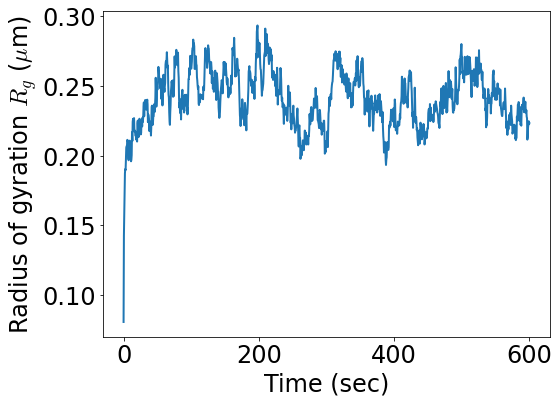

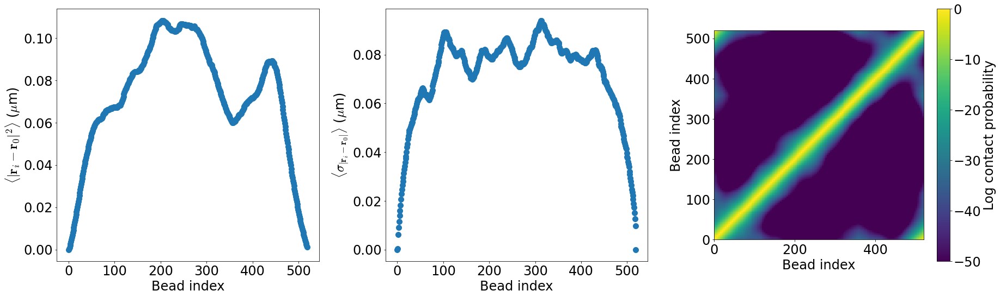

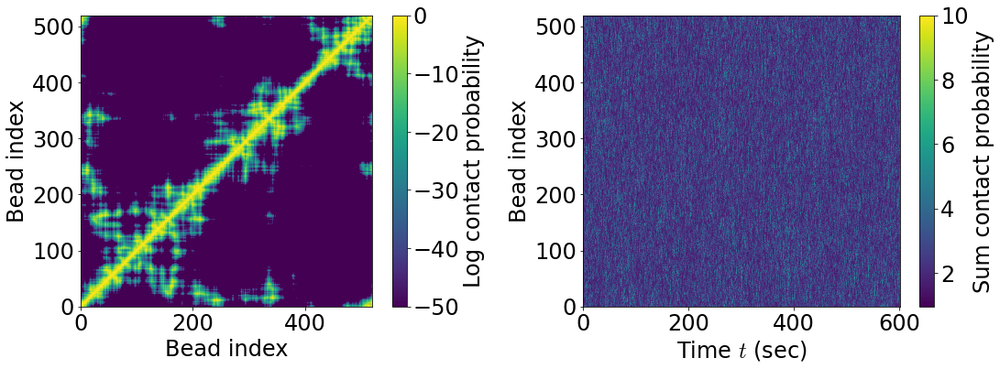

In [188]:
sd_data_path = list((ceph_path / "21-05-18_AMchr1_scan.8_loop520_pin/simulations/").glob('*/*.h5'))[0]
ss_ind = 100
with h5py.File(sd_data_path, 'r') as h5_data:
    time_arr = h5_data['time'][:]
    sy_dat = h5_data['raw_data']['sylinders'][:520,:,:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    
    fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
    
    log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr[:,:,ss_ind:], avg_block_step = 4)
    fig1, ax1 = aa.make_min_distr_plots(com_arr[:,:,ss_ind:], log_contact_avg_mat, rel_ind=0, hist_max=1.)
    
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, bead_range=[0,520])
    contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
    fig2, axarr2, contact_kymo = make_summed_contact_kymo_graph(contact_mat, time_arr)


<ipython-input-147-35ebceb89ae1>:18: RuntimeWarning: divide by zero encountered in log
  c2 = axarr2[0].pcolorfast(X, Y, np.log(contact_mat[:,:,-1]), vmin=-50)


Text(0.5, 0, 'Bead index')

Text(0, 0.5, 'Bead index')

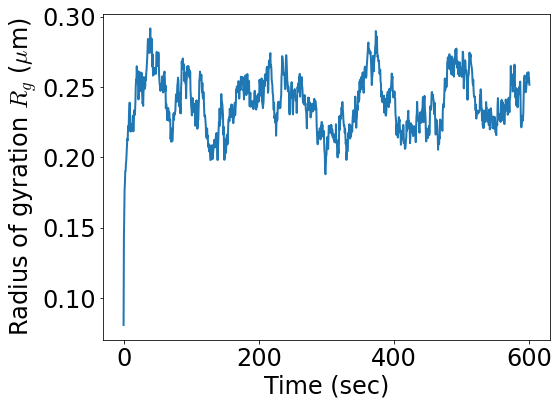

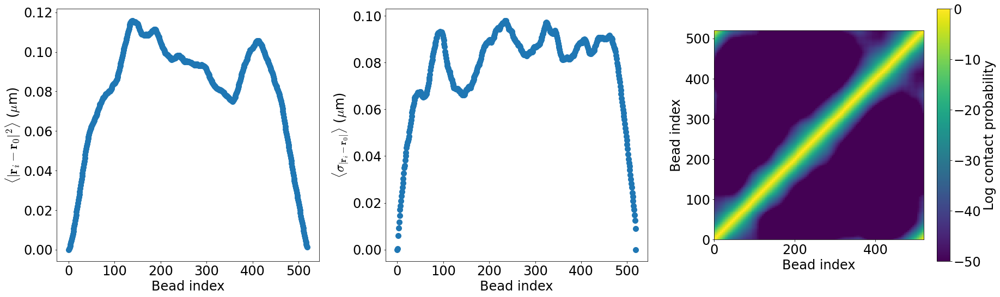

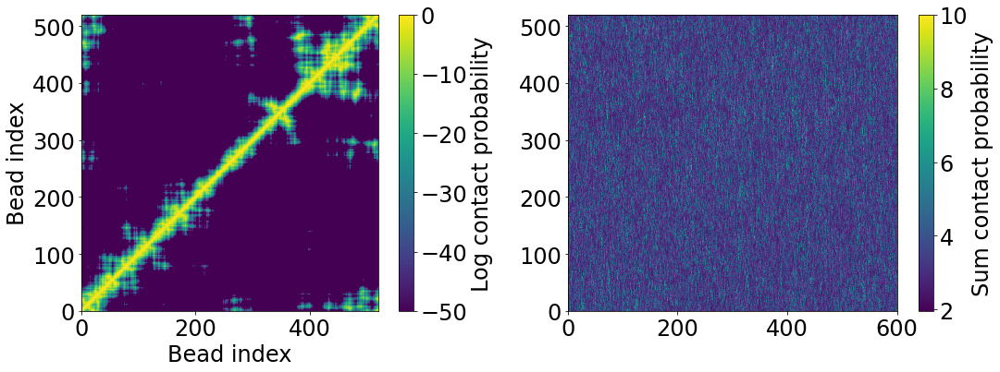

In [147]:
sd_data_path = list((ceph_path / "21-05-18_AMchr1_scan.8_loop520_pin/simulations/").glob('*/*.h5'))[1]
ss_ind = 100
with h5py.File(sd_data_path, 'r') as h5_data:
    time_arr = h5_data['time'][:]
    sy_dat = h5_data['raw_data']['sylinders'][:520,:,:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, bead_range=[0,520])
    contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
    
    log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr[:,:,ss_ind:], avg_block_step = 4)
    fig1, ax1 = aa.make_min_distr_plots(com_arr[:,:,ss_ind:], log_contact_avg_mat, rel_ind=0, hist_max=1.)
    
    fig2, axarr2 = plt.subplots(1,2, figsize=(16,6))
    nbeads = com_arr.shape[0]
    x = np.arange(nbeads + 1)[::int((nbeads) / contact_mat.shape[0])]
    X, Y = np.meshgrid(x, x)
    c2 = axarr2[0].pcolorfast(X, Y, np.log(contact_mat[:,:,-1]), vmin=-50)
    axarr2[0].set_aspect('equal')
    fig2.colorbar(c2, ax=axarr2[0], label="Log contact probability")
    axarr2[0].set_xlabel(r'Bead index')
    axarr2[0].set_ylabel(r'Bead index')
    #fig2.tight_layout()

    #fig3, ax3 = plt.subplots(figsize=(8,6))
    contact_kymo = np.sum(contact_mat, axis=0)
    y = np.arange(contact_kymo.shape[0]+1)
    x = np.arange(contact_kymo.shape[1]+1)*(time_arr[2]-time_arr[1])
    X, Y = np.meshgrid(x,y)  
    #c3 = axarr2[1].pcolorfast(X,Y, np.log(contact_kymo))
    #fig2.colorbar(c3, ax=axarr2[1], label="Log sum contact \n probability")
    c3 = axarr2[1].pcolorfast(X,Y, contact_kymo, vmax=10)
    fig2.colorbar(c3, ax=axarr2[1], label="Sum contact probability")
    fig2.tight_layout()


<ipython-input-158-2bd0600fc203>:18: RuntimeWarning: divide by zero encountered in log
  c2 = axarr2[0].pcolorfast(X, Y, np.log(contact_mat[:,:,-1]), vmin=-50)


Text(0.5, 0, 'Bead index')

Text(0, 0.5, 'Bead index')

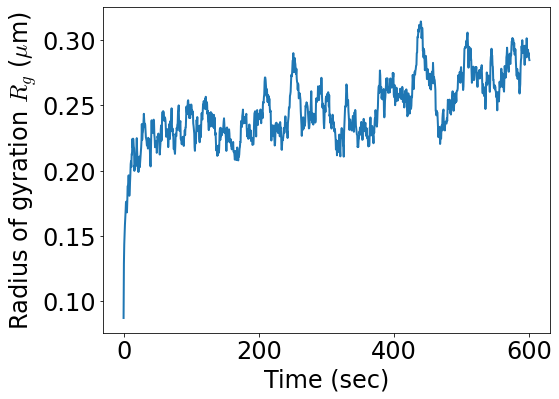

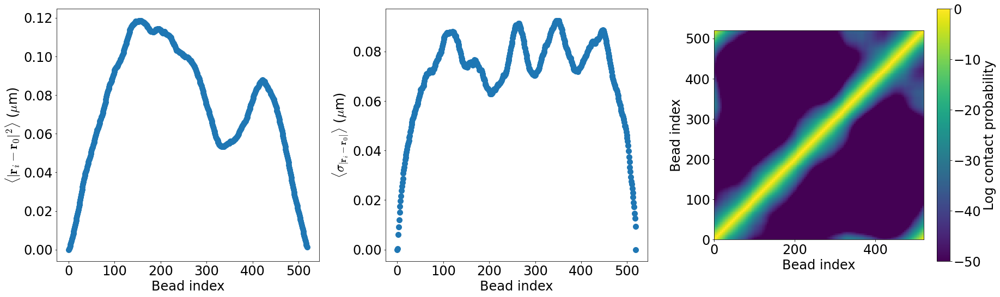

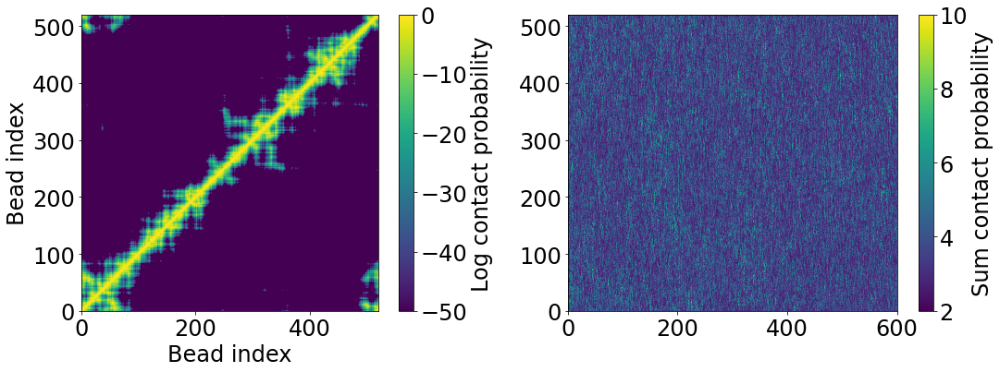

In [158]:
sd_data_path = list((ceph_path / "21-06-04_AMchr1_scan.8_loop520_pin_crowder5000_crRad.015/simulations/").glob('*/*.h5'))[1]
ss_ind = 100
with h5py.File(sd_data_path, 'r') as h5_data:
    time_arr = h5_data['time'][:]
    sy_dat = h5_data['raw_data']['sylinders'][:520,:,:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, bead_range=[0,520])
    contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
    
    log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr[:,:,ss_ind:], avg_block_step = 4)
    fig1, ax1 = aa.make_min_distr_plots(com_arr[:,:,ss_ind:], log_contact_avg_mat, rel_ind=0, hist_max=1.)
    
    fig2, axarr2 = plt.subplots(1,2, figsize=(16,6))
    nbeads = com_arr.shape[0]
    x = np.arange(nbeads + 1)[::int((nbeads) / contact_mat.shape[0])]
    X, Y = np.meshgrid(x, x)
    c2 = axarr2[0].pcolorfast(X, Y, np.log(contact_mat[:,:,-1]), vmin=-50)
    axarr2[0].set_aspect('equal')
    fig2.colorbar(c2, ax=axarr2[0], label="Log contact probability")
    axarr2[0].set_xlabel(r'Bead index')
    axarr2[0].set_ylabel(r'Bead index')
    #fig2.tight_layout()

    #fig3, ax3 = plt.subplots(figsize=(8,6))
    contact_kymo = np.sum(contact_mat, axis=0)
    y = np.arange(contact_kymo.shape[0]+1)
    x = np.arange(contact_kymo.shape[1]+1)*(time_arr[2]-time_arr[1])
    X, Y = np.meshgrid(x,y)  
    #c3 = axarr2[1].pcolorfast(X,Y, np.log(contact_kymo))
    #fig2.colorbar(c3, ax=axarr2[1], label="Log sum contact \n probability")
    c3 = axarr2[1].pcolorfast(X,Y, contact_kymo, vmax=10)
    fig2.colorbar(c3, ax=axarr2[1], label="Sum contact probability")
    fig2.tight_layout()


<ipython-input-162-60664c729c07>:18: RuntimeWarning: divide by zero encountered in log
  c2 = axarr2[0].pcolorfast(X, Y, np.log(contact_mat[:,:,-1]), vmin=-50)


Text(0.5, 0, 'Bead index')

Text(0, 0.5, 'Bead index')

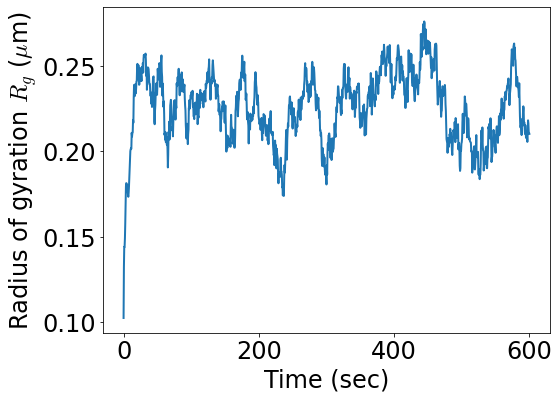

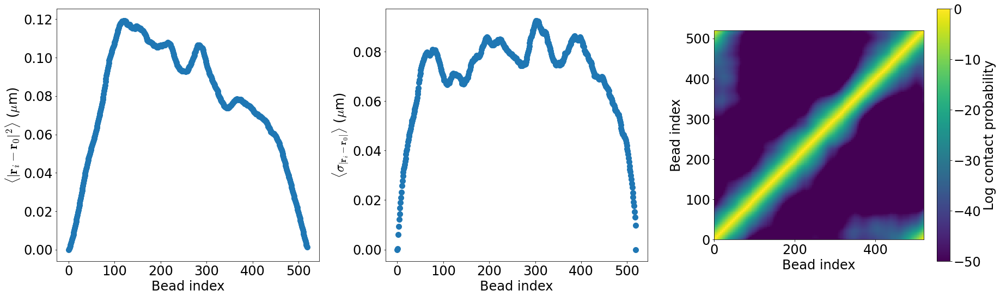

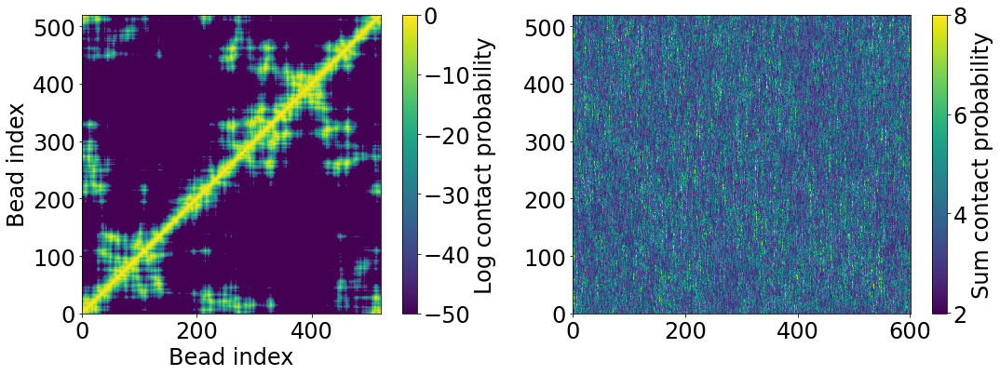

In [162]:
sd_data_path = list((mnt_path / "21-06-04_AMchr1_scan.8_loop520_pin_crowder4000_crRad.02/simulations/").glob('*/*.h5'))[0]
ss_ind = 100
with h5py.File(sd_data_path, 'r') as h5_data:
    time_arr = h5_data['time'][:]
    sy_dat = h5_data['raw_data']['sylinders'][:520,:,:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, bead_range=[0,520])
    contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
    
    log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr[:,:,ss_ind:], avg_block_step = 4)
    fig1, ax1 = aa.make_min_distr_plots(com_arr[:,:,ss_ind:], log_contact_avg_mat, rel_ind=0, hist_max=1.)
    
    fig2, axarr2 = plt.subplots(1,2, figsize=(16,6))
    nbeads = com_arr.shape[0]
    x = np.arange(nbeads + 1)[::int((nbeads) / contact_mat.shape[0])]
    X, Y = np.meshgrid(x, x)
    c2 = axarr2[0].pcolorfast(X, Y, np.log(contact_mat[:,:,-1]), vmin=-50)
    axarr2[0].set_aspect('equal')
    fig2.colorbar(c2, ax=axarr2[0], label="Log contact probability")
    axarr2[0].set_xlabel(r'Bead index')
    axarr2[0].set_ylabel(r'Bead index')
    #fig2.tight_layout()

    #fig3, ax3 = plt.subplots(figsize=(8,6))
    contact_kymo = np.sum(contact_mat, axis=0)
    y = np.arange(contact_kymo.shape[0]+1)
    x = np.arange(contact_kymo.shape[1]+1)*(time_arr[2]-time_arr[1])
    X, Y = np.meshgrid(x,y)  
    #c3 = axarr2[1].pcolorfast(X,Y, np.log(contact_kymo))
    #fig2.colorbar(c3, ax=axarr2[1], label="Log sum contact \n probability")
    c3 = axarr2[1].pcolorfast(X,Y, contact_kymo, vmax=8)
    fig2.colorbar(c3, ax=axarr2[1], label="Sum contact probability")
    fig2.tight_layout()


<ipython-input-163-874f22257f6d>:18: RuntimeWarning: divide by zero encountered in log
  c2 = axarr2[0].pcolorfast(X, Y, np.log(contact_mat[:,:,-1]), vmin=-50)


Text(0.5, 0, 'Bead index')

Text(0, 0.5, 'Bead index')

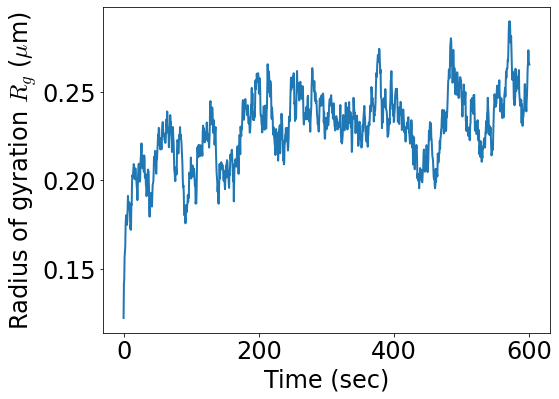

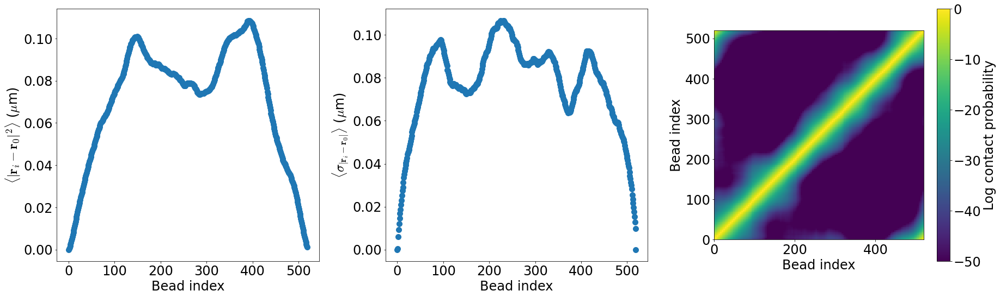

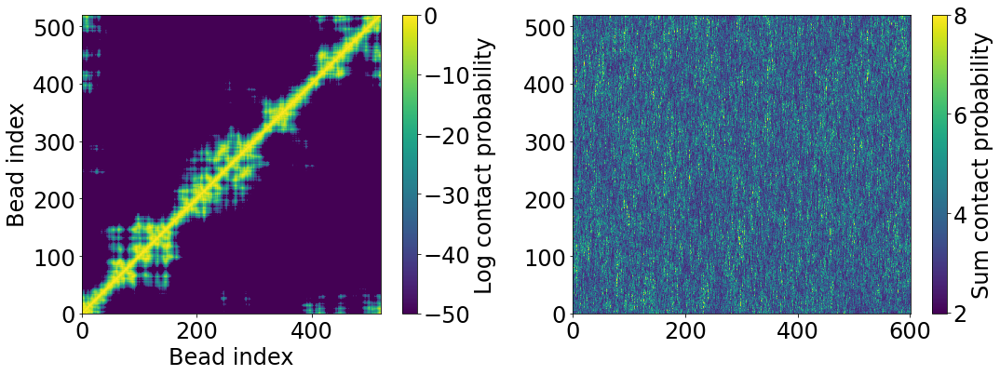

In [163]:
sd_data_path = list((mnt_path / "21-06-04_AMchr1_scan.8_loop520_pin_crowder4000_crRad.02/simulations/").glob('*/*.h5'))[1]
ss_ind = 100
with h5py.File(sd_data_path, 'r') as h5_data:
    time_arr = h5_data['time'][:]
    sy_dat = h5_data['raw_data']['sylinders'][:520,:,:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, bead_range=[0,520])
    contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
    
    log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr[:,:,ss_ind:], avg_block_step = 4)
    fig1, ax1 = aa.make_min_distr_plots(com_arr[:,:,ss_ind:], log_contact_avg_mat, rel_ind=0, hist_max=1.)
    
    fig2, axarr2 = plt.subplots(1,2, figsize=(16,6))
    nbeads = com_arr.shape[0]
    x = np.arange(nbeads + 1)[::int((nbeads) / contact_mat.shape[0])]
    X, Y = np.meshgrid(x, x)
    c2 = axarr2[0].pcolorfast(X, Y, np.log(contact_mat[:,:,-1]), vmin=-50)
    axarr2[0].set_aspect('equal')
    fig2.colorbar(c2, ax=axarr2[0], label="Log contact probability")
    axarr2[0].set_xlabel(r'Bead index')
    axarr2[0].set_ylabel(r'Bead index')
    #fig2.tight_layout()

    #fig3, ax3 = plt.subplots(figsize=(8,6))
    contact_kymo = np.sum(contact_mat, axis=0)
    y = np.arange(contact_kymo.shape[0]+1)
    x = np.arange(contact_kymo.shape[1]+1)*(time_arr[2]-time_arr[1])
    X, Y = np.meshgrid(x,y)  
    #c3 = axarr2[1].pcolorfast(X,Y, np.log(contact_kymo))
    #fig2.colorbar(c3, ax=axarr2[1], label="Log sum contact \n probability")
    c3 = axarr2[1].pcolorfast(X,Y, contact_kymo, vmax=8)
    fig2.colorbar(c3, ax=axarr2[1], label="Sum contact probability")
    fig2.tight_layout()


<ipython-input-167-2fce04e1c65f>:18: RuntimeWarning: divide by zero encountered in log
  c2 = axarr2[0].pcolorfast(X, Y, np.log(contact_mat[:,:,-1]), vmin=-50)


Text(0.5, 0, 'Bead index')

Text(0, 0.5, 'Bead index')

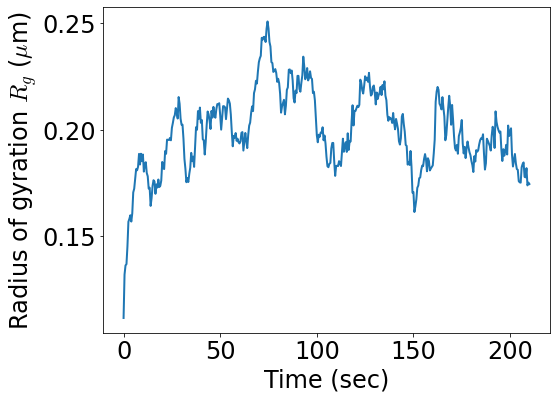

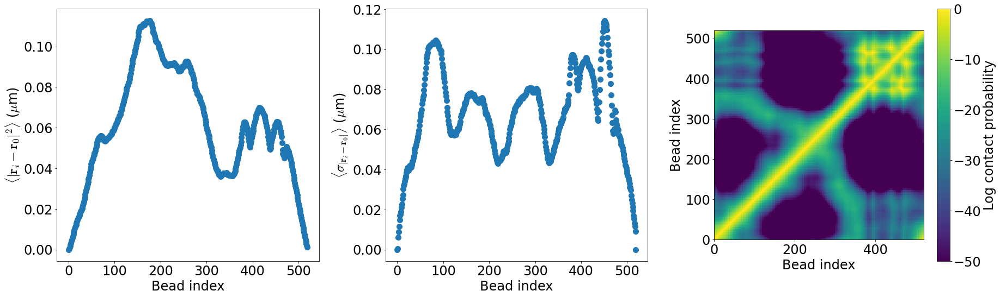

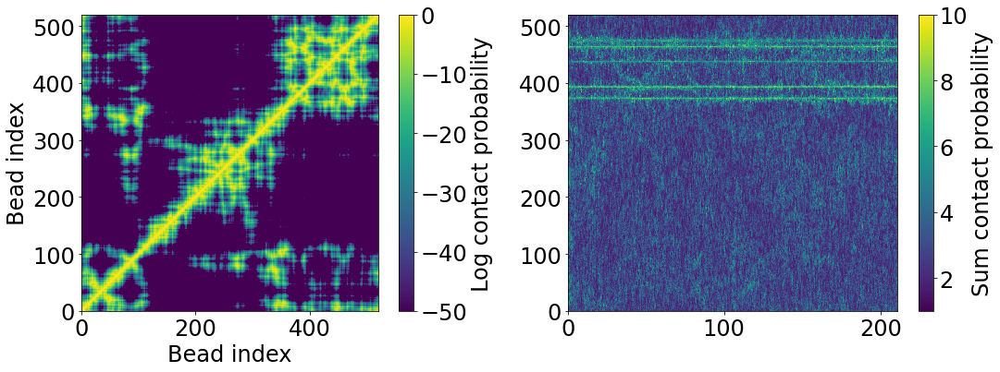

In [167]:
sd_data_path = list((mnt_path / "21-06-04_AMchr1_scan.8_loop520_pin_crowder4000_crRad.02/simulations/").glob('*/*.h5'))[2]
ss_ind = 100
with h5py.File(sd_data_path, 'r') as h5_data:
    time_arr = h5_data['time'][:]
    sy_dat = h5_data['raw_data']['sylinders'][:520,:,:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, bead_range=[0,520])
    contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
    
    log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr[:,:,ss_ind:], avg_block_step = 4)
    fig1, ax1 = aa.make_min_distr_plots(com_arr[:,:,ss_ind:], log_contact_avg_mat, rel_ind=0, hist_max=1.)
    
    fig2, axarr2 = plt.subplots(1,2, figsize=(16,6))
    nbeads = com_arr.shape[0]
    x = np.arange(nbeads + 1)[::int((nbeads) / contact_mat.shape[0])]
    X, Y = np.meshgrid(x, x)
    c2 = axarr2[0].pcolorfast(X, Y, np.log(contact_mat[:,:,-1]), vmin=-50)
    axarr2[0].set_aspect('equal')
    fig2.colorbar(c2, ax=axarr2[0], label="Log contact probability")
    axarr2[0].set_xlabel(r'Bead index')
    axarr2[0].set_ylabel(r'Bead index')
    #fig2.tight_layout()

    #fig3, ax3 = plt.subplots(figsize=(8,6))
    contact_kymo = np.sum(contact_mat, axis=0)-1
    y = np.arange(contact_kymo.shape[0]+1)
    x = np.arange(contact_kymo.shape[1]+1)*(time_arr[2]-time_arr[1])
    X, Y = np.meshgrid(x,y)  
    #c3 = axarr2[1].pcolorfast(X,Y, np.log(contact_kymo))
    #fig2.colorbar(c3, ax=axarr2[1], label="Log sum contact \n probability")
    c3 = axarr2[1].pcolorfast(X,Y, contact_kymo, vmax=10)
    fig2.colorbar(c3, ax=axarr2[1], label="Sum contact probability")
    fig2.tight_layout()


<ipython-input-166-d617d6aae14d>:18: RuntimeWarning: divide by zero encountered in log
  c2 = axarr2[0].pcolorfast(X, Y, np.log(contact_mat[:,:,-1]), vmin=-50)


Text(0.5, 0, 'Bead index')

Text(0, 0.5, 'Bead index')

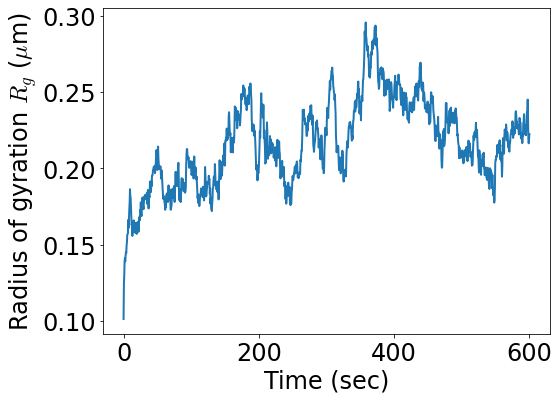

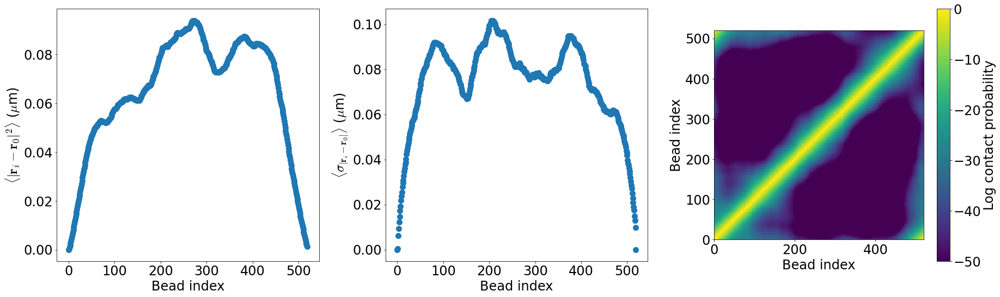

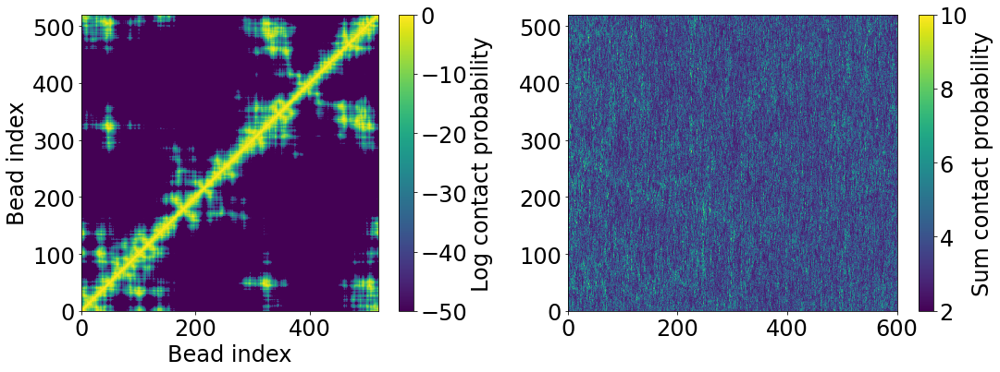

In [166]:
sd_data_path = list((mnt_path / "21-06-04_AMchr1_scan.8_loop520_pin_crowder4000_crRad.02/simulations/").glob('*/*.h5'))[3]
ss_ind = 100
with h5py.File(sd_data_path, 'r') as h5_data:
    time_arr = h5_data['time'][:]
    sy_dat = h5_data['raw_data']['sylinders'][:520,:,:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, bead_range=[0,520])
    contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
    
    log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr[:,:,ss_ind:], avg_block_step = 4)
    fig1, ax1 = aa.make_min_distr_plots(com_arr[:,:,ss_ind:], log_contact_avg_mat, rel_ind=0, hist_max=1.)
    
    fig2, axarr2 = plt.subplots(1,2, figsize=(16,6))
    nbeads = com_arr.shape[0]
    x = np.arange(nbeads + 1)[::int((nbeads) / contact_mat.shape[0])]
    X, Y = np.meshgrid(x, x)
    c2 = axarr2[0].pcolorfast(X, Y, np.log(contact_mat[:,:,-1]), vmin=-50)
    axarr2[0].set_aspect('equal')
    fig2.colorbar(c2, ax=axarr2[0], label="Log contact probability")
    axarr2[0].set_xlabel(r'Bead index')
    axarr2[0].set_ylabel(r'Bead index')
    #fig2.tight_layout()

    #fig3, ax3 = plt.subplots(figsize=(8,6))
    contact_kymo = np.sum(contact_mat, axis=0)-1
    y = np.arange(contact_kymo.shape[0]+1)
    x = np.arange(contact_kymo.shape[1]+1)*(time_arr[2]-time_arr[1])
    X, Y = np.meshgrid(x,y)  
    #c3 = axarr2[1].pcolorfast(X,Y, np.log(contact_kymo))
    #fig2.colorbar(c3, ax=axarr2[1], label="Log sum contact \n probability")
    c3 = axarr2[1].pcolorfast(X,Y, contact_kymo, vmax=10)
    fig2.colorbar(c3, ax=axarr2[1], label="Sum contact probability")
    fig2.tight_layout()


<ipython-input-171-b481f6034360>:18: RuntimeWarning: divide by zero encountered in log
  c2 = axarr2[0].pcolorfast(X, Y, np.log(contact_mat[:,:,-1]), vmin=-50)


Text(0.5, 0, 'Bead index')

Text(0, 0.5, 'Bead index')

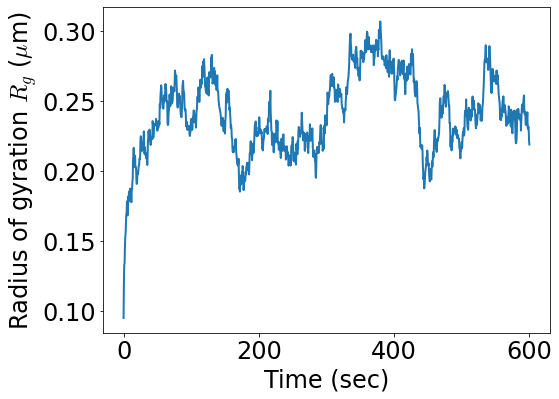

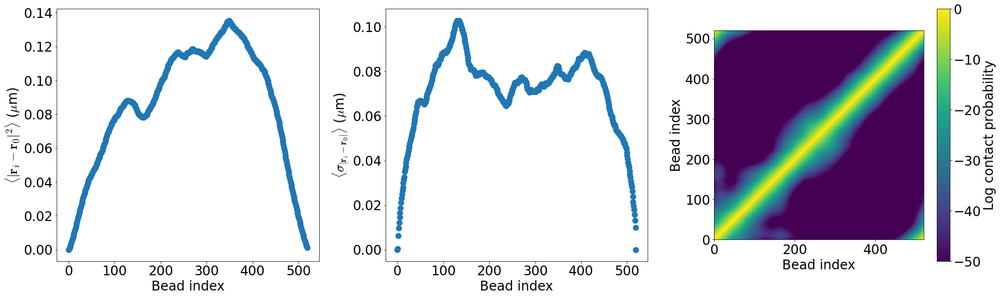

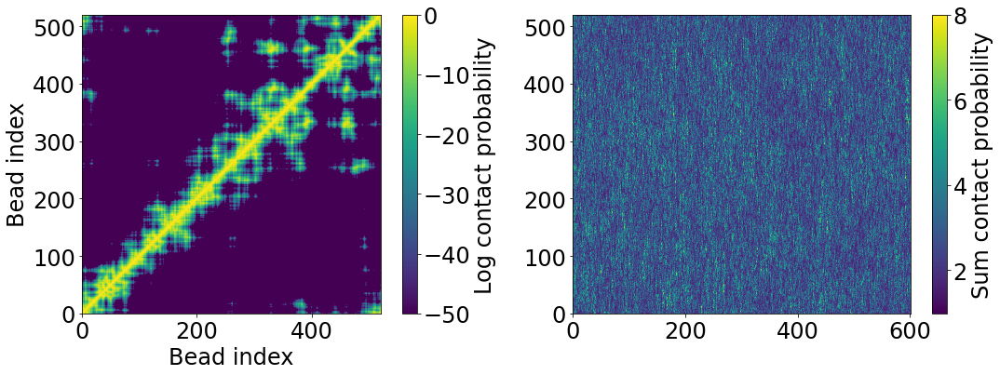

In [171]:
sd_data_path = list((mnt_path / "21-06-04_AMchr1_scan.8_loop520_pin_crowder4000_crRad.02/simulations/").glob('*/*.h5'))[4]
ss_ind = 100
with h5py.File(sd_data_path, 'r') as h5_data:
    time_arr = h5_data['time'][:]
    sy_dat = h5_data['raw_data']['sylinders'][:520,:,:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, bead_range=[0,520])
    contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
    
    log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr[:,:,ss_ind:], avg_block_step = 4)
    fig1, ax1 = aa.make_min_distr_plots(com_arr[:,:,ss_ind:], log_contact_avg_mat, rel_ind=0, hist_max=1.)
    
    fig2, axarr2 = plt.subplots(1,2, figsize=(16,6))
    nbeads = com_arr.shape[0]
    x = np.arange(nbeads + 1)[::int((nbeads) / contact_mat.shape[0])]
    X, Y = np.meshgrid(x, x)
    c2 = axarr2[0].pcolorfast(X, Y, np.log(contact_mat[:,:,-1]), vmin=-50)
    axarr2[0].set_aspect('equal')
    fig2.colorbar(c2, ax=axarr2[0], label="Log contact probability")
    axarr2[0].set_xlabel(r'Bead index')
    axarr2[0].set_ylabel(r'Bead index')
    #fig2.tight_layout()

    #fig3, ax3 = plt.subplots(figsize=(8,6))
    contact_kymo = np.sum(contact_mat, axis=0)-1
    y = np.arange(contact_kymo.shape[0]+1)
    x = np.arange(contact_kymo.shape[1]+1)*(time_arr[2]-time_arr[1])
    X, Y = np.meshgrid(x,y)  
    #c3 = axarr2[1].pcolorfast(X,Y, np.log(contact_kymo))
    #fig2.colorbar(c3, ax=axarr2[1], label="Log sum contact \n probability")
    c3 = axarr2[1].pcolorfast(X,Y, contact_kymo, vmax=8)
    fig2.colorbar(c3, ax=axarr2[1], label="Sum contact probability")
    fig2.tight_layout()


<ipython-input-172-b2481b6dd3d7>:18: RuntimeWarning: divide by zero encountered in log
  c2 = axarr2[0].pcolorfast(X, Y, np.log(contact_mat[:,:,-1]), vmin=-50)


Text(0.5, 0, 'Bead index')

Text(0, 0.5, 'Bead index')

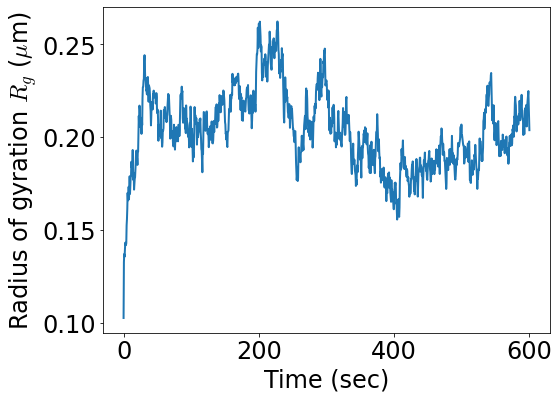

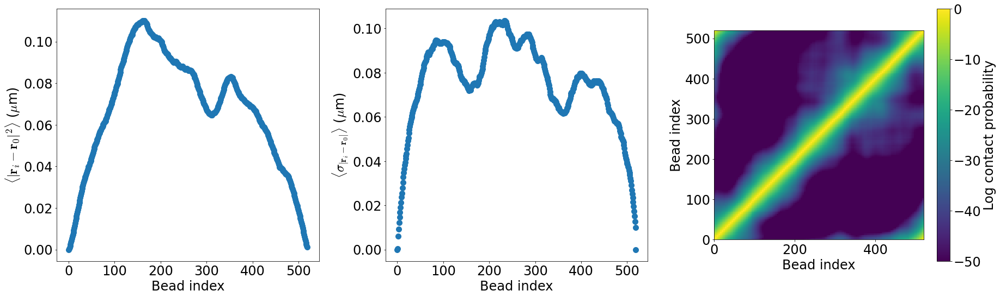

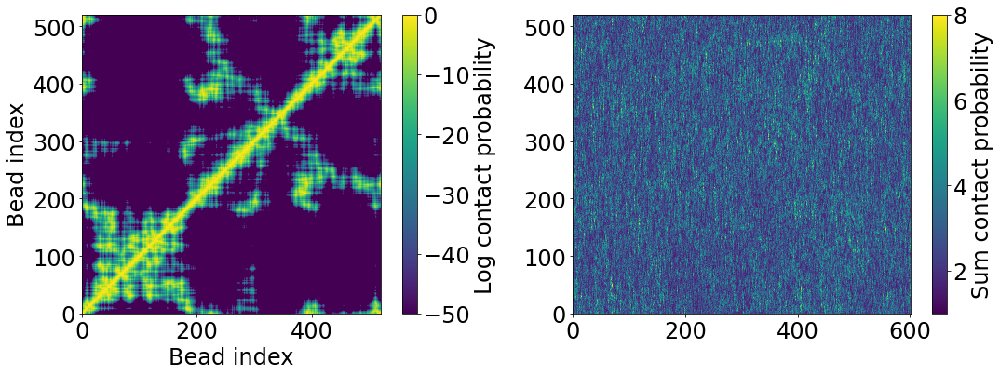

In [172]:
sd_data_path = list((mnt_path / "21-06-04_AMchr1_scan.8_loop520_pin_crowder4000_crRad.02/simulations/").glob('*/*.h5'))[5]
ss_ind = 100
with h5py.File(sd_data_path, 'r') as h5_data:
    time_arr = h5_data['time'][:]
    sy_dat = h5_data['raw_data']['sylinders'][:520,:,:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
    sep_dist_mat = aa.get_sep_dist_mat(h5_data, bead_range=[0,520])
    contact_mat = aa.gauss_weighted_contact(sep_dist_mat)
    
    log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr[:,:,ss_ind:], avg_block_step = 4)
    fig1, ax1 = aa.make_min_distr_plots(com_arr[:,:,ss_ind:], log_contact_avg_mat, rel_ind=0, hist_max=1.)
    
    fig2, axarr2 = plt.subplots(1,2, figsize=(16,6))
    nbeads = com_arr.shape[0]
    x = np.arange(nbeads + 1)[::int((nbeads) / contact_mat.shape[0])]
    X, Y = np.meshgrid(x, x)
    c2 = axarr2[0].pcolorfast(X, Y, np.log(contact_mat[:,:,-1]), vmin=-50)
    axarr2[0].set_aspect('equal')
    fig2.colorbar(c2, ax=axarr2[0], label="Log contact probability")
    axarr2[0].set_xlabel(r'Bead index')
    axarr2[0].set_ylabel(r'Bead index')
    #fig2.tight_layout()

    #fig3, ax3 = plt.subplots(figsize=(8,6))
    contact_kymo = np.sum(contact_mat, axis=0)-1
    y = np.arange(contact_kymo.shape[0]+1)
    x = np.arange(contact_kymo.shape[1]+1)*(time_arr[2]-time_arr[1])
    X, Y = np.meshgrid(x,y)  
    #c3 = axarr2[1].pcolorfast(X,Y, np.log(contact_kymo))
    #fig2.colorbar(c3, ax=axarr2[1], label="Log sum contact \n probability")
    c3 = axarr2[1].pcolorfast(X,Y, contact_kymo, vmax=8)
    fig2.colorbar(c3, ax=axarr2[1], label="Sum contact probability")
    fig2.tight_layout()


# Line/Rouse mode testing

## 512 line scan dt.001-.1

### dt0.1

In [ ]:
data_path = (ceph_path /"21-04-23_AMchr1_line512_scan5.1_dt.001-.1/simulations/dt0.100/")
ss_ind = 0
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    nbeads = com_arr.shape[0]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    mode_mat = get_rouse_modes(com_arr)
    
    ##com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 4)
mode_mat = get_rouse_modes(com_arr)

#Graphing
make_segment_distr_graphs(com_arr, [], [0,1], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
fig2, ax2 = make_total_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=40)



### dt0.030

In [ ]:
data_path = (ceph_path /"21-04-23_AMchr1_line512_scan5.1_dt.001-.1/simulations/dt0.030/")
ss_ind = 0
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    nbeads = com_arr.shape[0]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    mode_mat = get_rouse_modes(com_arr)
    
    ##com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 4)
mode_mat = get_rouse_modes(com_arr)

# Graphing
make_segment_distr_graphs(com_arr, [], [0,1], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
fig2, ax2 = make_total_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=40)

### dt0.01

In [ ]:
data_path = (ceph_path /"21-04-23_AMchr1_line512_scan5.1_dt.001-.1/simulations/dt0.010/")
ss_ind = 0
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    nbeads = com_arr.shape[0]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    mode_mat = get_rouse_modes(com_arr)
    
    ##com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 4)
mode_mat = get_rouse_modes(com_arr)

# Graphing
make_segment_distr_graphs(com_arr, [], [0,1], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
fig2, ax2 = make_total_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=40)

### dt0.003

In [ ]:
data_path = (ceph_path /"21-04-23_AMchr1_line512_scan5.1_dt.001-.1/simulations/dt0.003/")
ss_ind = 0
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    nbeads = com_arr.shape[0]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    mode_mat = get_rouse_modes(com_arr)
    
    ##com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 4)
mode_mat = get_rouse_modes(com_arr)

# Graphing
make_segment_distr_graphs(com_arr, [], [0,1], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
fig2, ax2 = make_total_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=40)

### dt0.001

In [ ]:
data_path = (ceph_path /"21-04-23_AMchr1_line512_scan5.1_dt.001-.1/simulations/dt0.001/")
ss_ind = 0
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    nbeads = com_arr.shape[0]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    mode_mat = get_rouse_modes(com_arr)
    
    ##com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 4)
mode_mat = get_rouse_modes(com_arr)

# Graphing
make_segment_distr_graphs(com_arr, [], [0,1], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
fig2, ax2 = make_total_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=40)

## 512 RS line scan dt.001-.1

### dt0.1

In [ ]:
data_path = (ceph_path /"21-04-23_AMchr1_RS_line512_scan5.1_dt.001-.1/simulations/dt0.100/")
ss_ind = 0
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    nbeads = com_arr.shape[0]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    mode_mat = get_rouse_modes(com_arr)
    
    ##com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 4)
mode_mat = get_rouse_modes(com_arr)

#Graphing
make_segment_distr_graphs(com_arr, [], [0,1], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
#fig2, ax2 = make_total_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=80)



### dt0.030

In [ ]:
data_path = (ceph_path /"21-04-23_AMchr1_RS_line512_scan5.1_dt.001-.1/simulations/dt0.030/")
ss_ind = 0
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    nbeads = com_arr.shape[0]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    mode_mat = get_rouse_modes(com_arr)
    
    ##com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 4)
mode_mat = get_rouse_modes(com_arr)

# Graphing
make_segment_distr_graphs(com_arr, [], [0,1], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
#fig2, ax2 = make_total_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=40)

### dt0.01

In [ ]:
data_path = (ceph_path /"21-04-23_AMchr1_RS_line512_scan5.1_dt.001-.1/simulations/dt0.010/")
ss_ind = 0
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    nbeads = com_arr.shape[0]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    mode_mat = get_rouse_modes(com_arr)
    
    ##com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 4)
mode_mat = get_rouse_modes(com_arr)

# Graphing
make_segment_distr_graphs(com_arr, [], [0,1], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
#fig2, ax2 = make_total_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=40)

### dt0.003

In [ ]:
data_path = (ceph_path /"21-04-23_AMchr1_RS_line512_scan5.1_dt.001-.1/simulations/dt0.003/")
ss_ind = 0
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    nbeads = com_arr.shape[0]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    mode_mat = get_rouse_modes(com_arr)
    
    ##com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 4)
mode_mat = get_rouse_modes(com_arr)

# Graphing
make_segment_distr_graphs(com_arr, [], [0,1], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
fig2, ax2 = make_total_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=40)

In [ ]:
# Graphing
#make_segment_distr_graphs(com_arr, [], [0,1], 1,2)
#fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
#fig2, ax2 = make_total_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=100)

### dt0.001

In [ ]:
data_path = (ceph_path /"21-04-23_AMchr1_RS_line512_scan5.1_dt.001-.1/simulations/dt0.001/")
ss_ind = 0
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    nbeads = com_arr.shape[0]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    mode_mat = get_rouse_modes(com_arr)
    
    ##com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 4)
mode_mat = get_rouse_modes(com_arr)

# Graphing
make_segment_distr_graphs(com_arr, [], [0,1], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
fig2, ax2 = make_total_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=40)

## 512 RS $l_o=0$ line

In [ ]:
data_path = (ceph_path /"21-04-29_AMchr1_RS_line512_lo0/")
ss_ind = 0
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    nbeads = com_arr.shape[0]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    
    ##com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 4)
mode_mat = get_rouse_modes(com_arr)

# Graphing
make_segment_distr_graphs(com_arr, [], [0,1], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
fig2, ax2 = make_total_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=20)

## 512 RS $l_o=0$ line equil

In [ ]:
data_path = (ceph_path /"21-05-07_AMchr1_RS_line512eq_lo0/")
ss_ind = 0
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    nbeads = com_arr.shape[0]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    
    ##com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 4)
mode_mat = get_rouse_modes(com_arr)

# Graphing
fig0, ax0 = make_segment_distr_graphs(com_arr, [], [0,1], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=40)

## 512 RS $l_o=0, k_l=36.50$ line

In [ ]:
data_path = (ceph_path /"21-04-29_AMchr1_RS_line512_lo0_kl36.50/")
ss_ind = 0
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    nbeads = com_arr.shape[0]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])

log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 4)
mode_mat = get_rouse_modes(com_arr)

# Graphing
fig0, ax0 = make_segment_distr_graphs(com_arr, [], [0,1], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=40)

## 512 RS $l_o=0, k_l=36.50$ line equil

In [ ]:
data_path = (ceph_path /"21-05-05_AMchr1_RS_line512_lo0_kl36.50/")
ss_ind = 0
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    nbeads = com_arr.shape[0]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    
log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 4)
mode_mat = get_rouse_modes(com_arr)

# Graphing
fig0, ax0 = make_segment_distr_graphs(com_arr, [], [0,1], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=40)

## 512 RS $l_o=0, k_l=36.50, dt=.003$ line equil

In [ ]:
data_path = (ceph_path /"21-05-05_AMchr1_RS_line512_lo0_kl36.50_dt.003/")
ss_ind = 0
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    nbeads = com_arr.shape[0]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    #mode_mat = get_rouse_modes(com_arr)

log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 4)
mode_mat = get_rouse_modes(com_arr)

# Graphing
fig0, ax0 = make_segment_distr_graphs(com_arr, [], [0,1], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=40)

## 512 RS $l_o=0, k_l=36.50, dt=.0001, \eta=1.0$ line equil

In [ ]:
data_path = (ceph_path /"21-05-11_AMchr1_RS_line512eq_lo0_kl36.50_visc1.0/")
ss_ind = 0
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    nbeads = com_arr.shape[0]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    #mode_mat = get_rouse_modes(com_arr)

log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 4)
mode_mat = get_rouse_modes(com_arr)

# Graphing
fig0, ax0 = make_segment_distr_graphs(com_arr, [], [0,1], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=40)

## 512 RS $l_o=0, k_l=36.50, dt=.0001, \eta=1.0, ts=.1$ line equil

In [ ]:
data_path = (ceph_path /"21-05-12_AMchr1_RS_line512eq_lo0_kl36.50_visc1.0_ts.1/")
ss_ind = 0
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    nbeads = com_arr.shape[0]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    #mode_mat = get_rouse_modes(com_arr)

log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 4)
mode_mat = get_rouse_modes(com_arr)

# Graphing
fig0, ax0 = make_segment_distr_graphs(com_arr, [], [0,1], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

# Conclusions and Next Steps

# Old

In [ ]:
h5_data_paths = (ceph_path /"21-04-14_AMchr1_looptails512-117-394eq_scan.6_50hr/simulations/").glob('s*/*.h5')
com_arr = None
ss_ind = 0
for h5_path in h5_data_paths:
    with h5py.File(h5_path, 'r+') as h5_data:
        sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
        if not isinstance(com_arr,np.ndarray):
            com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
            continue
        com_arr = np.append(com_arr, .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :]), axis=-1)
log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 4)

fig, ax = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=117, hist_max=1.)

## 520 loop confinement scan

In [ ]:
data_path = (ceph_path /"21-05-14_AMchr1_loop520_scan5.1_pin_visc1.0_Rconf.25-2.0/")
ss_ind = 0
fig, ax = plt.subplots(figsize=(8,6))
for h5_path in data_path.glob('**/*.h5'):
    with h5py.File(h5_path, 'r+') as h5_data:
        time_arr = h5_data['time'][ss_ind:]
        sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
        com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
        rog_arr = aa.calc_rad_of_gyration(com_arr)
        ee_dist = get_end_end_distance(com_arr)
    
        _ = ax.plot(time_arr, rog_arr, label=h5_path.name)
        
_ = ax.set_xlabel('Time (sec)')
_ = ax.set_ylabel('Radius of gyration $R_g$ ($\mu$m)')
_ = ax.legend(bbox_to_anchor=(1,1), loc="upper left")

## 520 loop confinement seed avg

8


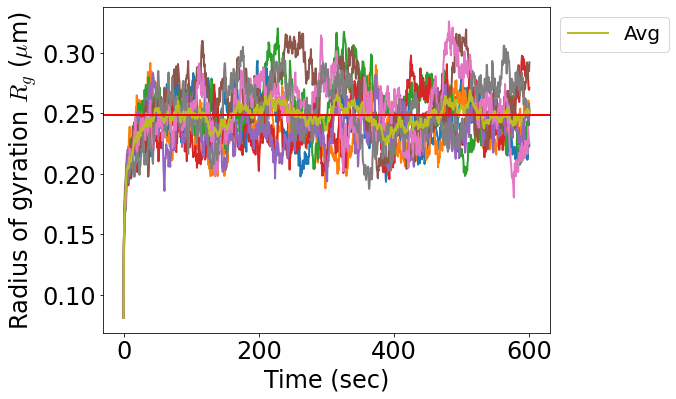

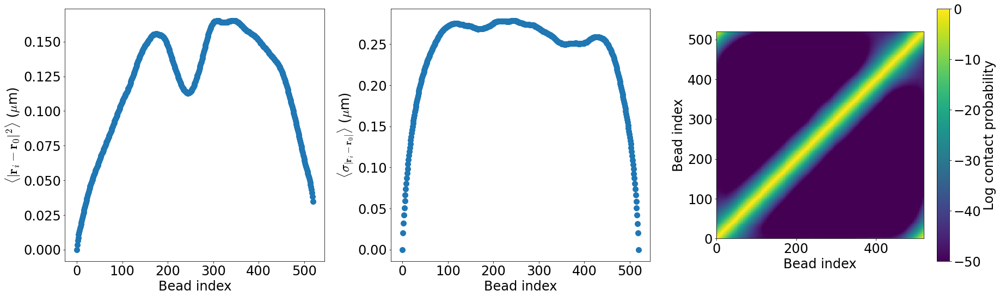

In [39]:
sd_data_paths = list((ceph_path / "21-05-18_AMchr1_scan.8_loop520_pin/simulations/").glob('*/*.h5'))
ss_ind = 0
rog_avg_arr = None
com_arr_tot = None
for h5_path in sd_data_paths:
    with h5py.File(h5_path, 'r+') as h5_data:
        time_arr = h5_data['time'][ss_ind:]
        sy_dat = h5_data['raw_data']['sylinders'][:520,:,ss_ind:]
        com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
        
        if not isinstance(com_arr_tot,np.ndarray):
            com_arr_tot = com_arr[...]
        else:
            com_arr_tot = np.append(com_arr_tot, com_arr, axis=-1)

        if not isinstance(rog_avg_arr, np.ndarray):
            fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
            rog_avg_arr = aa.calc_rad_of_gyration(com_arr)
        else:
            min_len = min(rog_avg_arr.size, com_arr.shape[-1])
            aa.plot_rog_vs_time_graph(ax, time_arr, com_arr)
            rog_avg_arr[:min_len] += aa.calc_rad_of_gyration(com_arr[:,:,:min_len])
            rog_avg_arr = rog_avg_arr[:min_len]
print(len(sd_data_paths))
rog_avg_arr /= len(sd_data_paths)
_ = ax.plot(time_arr[:min_len], rog_avg_arr[:min_len], label='Avg')
_ = ax.axhline(rog_avg_arr[400:min_len].mean(), color='r')
_ = ax.legend(bbox_to_anchor=(1,1), loc='upper left')

log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr_tot, avg_block_step = 4)
fig1, ax1 = aa.make_min_distr_plots(com_arr_tot, log_contact_avg_mat, rel_ind=0, hist_max=1.)


## 520 loop 1000 crowder seed avg

s5
s8
s7
s1
s4
s3
s2
s6
8


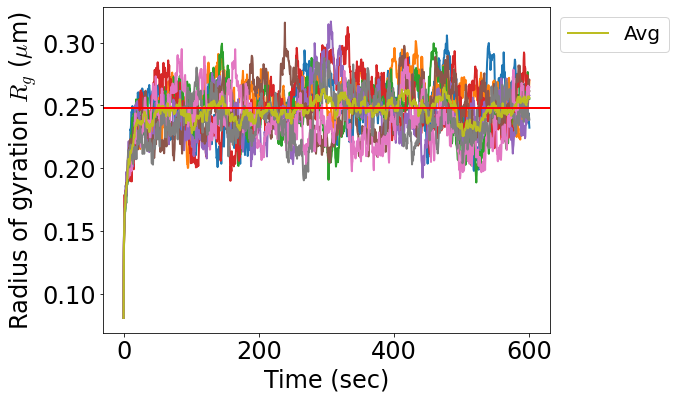

In [43]:
sd_data_paths = list((ceph_path /"21-05-18_AMchr1_scan.8_loop520_pin_crowder1000/simulations/").glob('*/*.h5'))
ss_ind = 0
rog_avg_arr = None
for h5_path in sd_data_paths:
    with h5py.File(h5_path, 'r+') as h5_data:
        time_arr = h5_data['time'][ss_ind:]
        sy_dat = h5_data['raw_data']['sylinders'][:520,:,ss_ind:]
        com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
        print(h5_path.stem)
        
        if not isinstance(rog_avg_arr, np.ndarray):
            fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
            rog_avg_arr = aa.calc_rad_of_gyration(com_arr)
        else:
            aa.plot_rog_vs_time_graph(ax, time_arr, com_arr)
            rog_avg_arr += aa.calc_rad_of_gyration(com_arr)
print(len(sd_data_paths))
rog_avg_arr /= len(sd_data_paths)
ax.plot(time_arr, rog_avg_arr, label='Avg')
ax.axhline(rog_avg_arr[400:].mean(), color='r')
_ = ax.legend(bbox_to_anchor=(1,1), loc='upper left')


## 520 loop 2000 crowder seed avg

In [ ]:
sd_data_paths = list((ceph_path /"21-05-18_AMchr1_scan.8_loop520_pin_crowder2000/simulations/").glob('*/*.h5'))
ss_ind = 0
rog_avg_arr = None
for h5_path in sd_data_paths:
    with h5py.File(h5_path, 'r+') as h5_data:
        time_arr = h5_data['time'][ss_ind:]
        sy_dat = h5_data['raw_data']['sylinders'][:520,:,ss_ind:]
        com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
        if not isinstance(rog_avg_arr, np.ndarray):
            fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
            rog_avg_arr = aa.calc_rad_of_gyration(com_arr)
        else:
            aa.plot_rog_vs_time_graph(ax, time_arr, com_arr)
            rog_avg_arr += aa.calc_rad_of_gyration(com_arr)
print(len(sd_data_paths))
rog_avg_arr /= len(sd_data_paths)
ax.plot(time_arr, rog_avg_arr, label='Avg')
ax.axhline(rog_avg_arr[400:].mean(), color='r')
_ = ax.legend(bbox_to_anchor=(1,1), loc='upper left')


## 520 loop 1000 crowder Rad.005 seed avg

In [ ]:
sd_data_paths = list((ceph_path /"21-05-18_AMchr1_scan.8_loop520_pin_crowder1000_crRad.005/simulations/").glob('*/*.h5'))
ss_ind = 0
rog_avg_arr = None
for h5_path in sd_data_paths:
    with h5py.File(h5_path, 'r+') as h5_data:
        time_arr = h5_data['time'][ss_ind:]
        sy_dat = h5_data['raw_data']['sylinders'][:520,:,ss_ind:]
        com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
        if not isinstance(rog_avg_arr, np.ndarray):
            fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
            rog_avg_arr = aa.calc_rad_of_gyration(com_arr)
        else:
            aa.plot_rog_vs_time_graph(ax, time_arr, com_arr)
            rog_avg_arr += aa.calc_rad_of_gyration(com_arr)
print(len(sd_data_paths))
rog_avg_arr /= len(sd_data_paths)
ax.plot(time_arr, rog_avg_arr, label='Avg')
ax.axhline(rog_avg_arr[400:].mean(), color='r')
_ = ax.legend(bbox_to_anchor=(1,1), loc='upper left')


## 520 loop 1000 crowder Rad.015 seed avg

In [ ]:
sd_data_paths = list((ceph_path / "21-05-27_AMchr1_scan.8_loop520_pin_crowder1000_crRad.015/simulations/").glob('*/*.h5'))
ss_ind = 0
rog_avg_arr = None
com_arr_tot = None
for h5_path in sd_data_paths:
    with h5py.File(h5_path, 'r+') as h5_data:
        time_arr = h5_data['time'][ss_ind:]
        sy_dat = h5_data['raw_data']['sylinders'][:520,:,ss_ind:]
        com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
        if not isinstance(rog_avg_arr, np.ndarray):
            fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
            rog_avg_arr = aa.calc_rad_of_gyration(com_arr)
        else:
            aa.plot_rog_vs_time_graph(ax, time_arr, com_arr)
            rog_avg_arr += aa.calc_rad_of_gyration(com_arr)
            
        if not isinstance(com_arr_tot,np.ndarray):
            com_arr_tot = com_arr[...]
        else:
            com_arr_tot = np.append(com_arr_tot, com_arr, axis=-1)
print(len(sd_data_paths))
rog_avg_arr /= len(sd_data_paths)
_ = ax.plot(time_arr, rog_avg_arr, label='Avg')
_ = ax.axhline(rog_avg_arr[400:].mean(), color='r')
_ = ax.legend(bbox_to_anchor=(1,1), loc='upper left')

log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr_tot, avg_block_step = 4)
fig1, ax1 = aa.make_min_distr_plots(com_arr_tot, log_contact_avg_mat, rel_ind=0, hist_max=1.)


packing_fraction = get_pfract(520, .01, 1000, .015, .5)
print(packing_fraction)

## 520 loop 3000 crowder seed avg

In [ ]:
sd_data_paths = list((ceph_path /"21-05-27_AMchr1_scan.8_loop520_pin_crowder3000/simulations/").glob('*/*.h5'))
ss_ind = 0
rog_avg_arr = None
for h5_path in sd_data_paths:
    with h5py.File(h5_path, 'r+') as h5_data:
        time_arr = h5_data['time'][ss_ind:]
        sy_dat = h5_data['raw_data']['sylinders'][:520,:,ss_ind:]
        com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
        if not isinstance(rog_avg_arr, np.ndarray):
            fig, ax = aa.make_rog_vs_time_graph(time_arr, com_arr)
            rog_avg_arr = aa.calc_rad_of_gyration(com_arr)
        else:
            min_len = min(rog_avg_arr.size, com_arr.shape[-1])
            aa.plot_rog_vs_time_graph(ax, time_arr, com_arr)
            rog_avg_arr[:min_len] += aa.calc_rad_of_gyration(com_arr[:,:,:min_len])
            rog_avg_arr = rog_avg_arr[:min_len]
print(len(sd_data_paths))
rog_avg_arr /= len(sd_data_paths)
_ = ax.plot(time_arr[:min_len], rog_avg_arr[:min_len], label='Avg')
_ = ax.axhline(rog_avg_arr[400:min_len].mean(), color='r')
_ = ax.legend(bbox_to_anchor=(1,1), loc='upper left')


## 520 loop 1000 crowder

In [ ]:
data_path = (ceph_path /"21-05-18_AMchr1_scan.8_loop520_pin_crowder1000/simulations/s2/")
ss_ind = 300
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:520,:,ss_ind:]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    nbeads = com_arr.shape[0]


log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 4)
#mode_mat = get_rouse_modes(com_arr)

# Graphing
fig0, ax0 = make_segment_distr_graphs(com_arr, [], [0,1], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
fig2, ax2 = aa.make_rog_vs_time_graph(time_arr, com_arr)

#fig2, ax2 = make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=50)

## 1040 RS 2 loop

In [ ]:
data_path = (ceph_path /"21-04-26_AMchr1_2loop1040/")
ss_ind = 0
with h5py.File(next(data_path.glob('*.h5')), 'r+') as h5_data:
    time_arr = h5_data['time'][ss_ind:]
    sy_dat = h5_data['raw_data']['sylinders'][:,:,ss_ind:]
    nbeads = com_arr.shape[0]
    com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
    mode_mat = get_rouse_modes(com_arr)
    
    ##com_arr = .5 * (sy_dat[:, 2:5, :] + sy_dat[:, 5:8, :])
log_contact_avg_mat = aa.get_time_avg_contact_mat(com_arr, avg_block_step = 4)
mode_mat = get_rouse_modes(com_arr)

# Graphing
make_segment_distr_graphs(com_arr, [], [0,1], 1,2)
fig1, ax1 = aa.make_min_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
fig2, ax2 = make_total_distr_plots(com_arr, log_contact_avg_mat, rel_ind=0, hist_max=1.)
make_rouse_analysis_plots(time_arr, mode_mat, nbeads, max_ind=40)